<a href="https://colab.research.google.com/github/Cristian2820/Senales-y-sistemas/blob/main/Copia_de_Parcial_2S2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install numpy
!pip install matplotlib

# PREGUNTA 1

Este código en Python utiliza las bibliotecas `numpy` y `matplotlib` para definir y graficar una señal en función del tiempo.  
- Se establece un intervalo de tiempo desde $-\pi$ hasta $\pi$.  
- Se calcula la frecuencia angular $\omega_0 = \frac{2\pi}{t_f - t_i}$ y la frecuencia fundamental $F_0 = \frac{\omega_0}{2\pi}$.  
- Se define la frecuencia de muestreo $F_s = 10F_0$, asegurando que cumpla con el criterio de Nyquist $F_s \geq 2F_0$.  
- Se genera un vector de tiempo `tv` con valores espaciados según la frecuencia de muestreo.  
- La señal de entrada $x(t)$ se define como el cuadrado del valor absoluto de $4\sin(3t)$.  
- Finalmente, se grafica la señal en función del tiempo, añadiendo etiquetas a los ejes y una cuadrícula para mejor visualización.


Ingrese un valor de entero positivo para A: 10
Ingrese un valor de frecuencia positiva para Fo: 12
wo= 75.39822368615503
Fo= 12.0


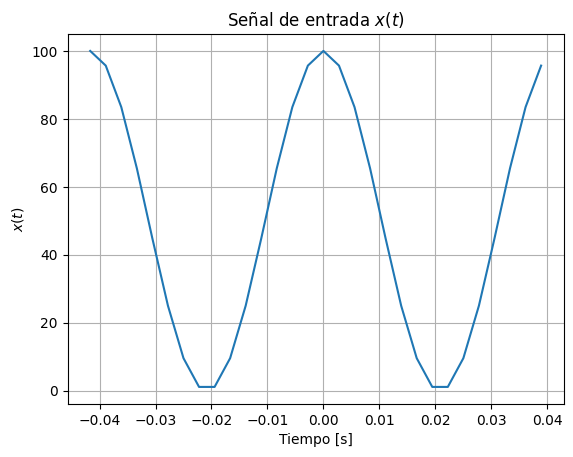

Fs= 360.0


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Ingreso de la amplitud A y la frecuencia Fo
A = int(input("Ingrese un valor de entero positivo para A: "))
Fo = float(input("Ingrese un valor de frecuencia positiva para Fo: "))

# Simulación de la señal de entrada
ti = -1 / (2 * Fo)  # tiempo inicial
tf = 1 / (2 * Fo)   # tiempo final
T = tf - ti         # periodo total (duración del intervalo)
wo = 2 * np.pi / T  # frecuencia angular
print('wo=', wo)
print('Fo=', Fo)

Fs = 30 * Fo  # frecuencia de muestreo (respetar Nyquist, Fs >= 2Fo)
tv = np.arange(ti, tf, 1 / Fs)  # vector de tiempo
Nm = len(tv)  # número de muestras en el tiempo

# Señal de entrada |A cos(2πF_ot)|^2
xo = abs(A * np.cos(2 * np.pi * Fo * tv))**2  # señal |A cos(2πF_ot)|^2
plt.plot(tv, xo)  # gráfica de la señal
plt.xlabel('Tiempo [s]')
plt.ylabel('$x(t)$')
plt.title("Señal de entrada $x(t)$")
plt.grid()
plt.show()
print('Fs=', Fs)

Este fragmento de código genera las bases de la serie exponencial compleja de Fourier para representar la señal en un intervalo de interés.  

- Se define el período $T$ como la diferencia entre el tiempo final y el tiempo inicial.  
- Se establece $N = 50$, que representa el número de armónicos a considerar en la serie de Fourier.  
- Se recalcula la frecuencia fundamental como $\omega_0 = \frac{2\pi}{T}$.  
- Se crea una matriz `phin` de tamaño $(\text{len}(tv), 2N+1)$ con valores complejos para almacenar las bases de Fourier.  
- Luego, se llena la matriz iterando sobre $ n $ desde $-N$ hasta $N$, calculando la base de Fourier correspondiente mediante la expresión $e^{jn\omega_0 t}$ y almacenándola en la matriz `phin`.

In [ ]:
#se crean las bases de la serie exponencial compleja de Fourier
T = tf - ti #intervalo de interés
N = 50 #número armonicos a simular
wo = 2*np.pi/T # frecuencia fundamental
# definir bases
phin = np.zeros((len(tv),2*N+1),dtype=np.complex_)#crear matriz para guardar bases
for n in range(-N,N+1,1):
    phin[:,n+N] = np.exp(1j*n*wo*tv)#base de fourier en el intervalo de interés

Este fragmento de código permite visualizar las bases de la serie exponencial compleja de Fourier interactivamente.

- Se importa `interact` y `IntSlider` de `ipywidgets` para crear una interfaz interactiva.  
- Se define la función `pltbase(n)`, que grafica la parte real y la parte imaginaria de la base de Fourier correspondiente al índice $ n $.  
  - La parte real de la base se grafica en azul y se etiqueta como "$Re{(t)}$".  
  - La parte imaginaria se grafica en naranja y se etiqueta como "$Im{(t)}$".  
  - Se agregan etiquetas a los ejes, una cuadrícula y una leyenda para mejorar la visualización.  
- Se usa `interact(pltbase, n=(-N,N,1))` para generar un control deslizante que permite cambiar el valor de $ n $ entre $-N$ y $N$ en pasos de 1.  

Esto facilita la exploración visual de cómo cambian las bases de Fourier con diferentes valores de $ n $.

In [ ]:
# graficar bases
from ipywidgets import interact,IntSlider

def pltbase(n=1):
    plt.plot(tv,np.real(phin[:,int(n+N)]),label="Re{(t)}")
    plt.xlabel("t[s]",fontsize = 14)
    plt.ylabel("(t)",fontsize = 14)
    plt.plot(tv,np.imag(phin[:,int(n+N)]),label="Im{(t)}")
    plt.grid()
    plt.legend()
    plt.show()
    return
interact(pltbase,n=(-N,N,1))

interactive(children=(IntSlider(value=1, description='n', max=50, min=-50), Output()), _dom_classes=('widget-i…

<function __main__.pltbase(n=1)>

Este fragmento de código calcula el espectro de la serie de Fourier, definiendo los coeficientes \( C_n \) que representan la contribución de cada armónico en la señal analizada.

- Se crea un vector `cn` de números complejos con tamaño $ 2N+1$, inicializado en ceros.  
- Se genera un vector `nv` con los índices de los armónicos, desde $-N$ hasta $N$.  
- Se asignan valores específicos a los coeficientes de Fourier:
  - $ C_0 = 8 $ representa el nivel de componente de continua (DC).  
  - $ C_{-6} = -4 $ y $ C_{6} = -4 $ indican la contribución de los armónicos de orden $ \pm6 $.  

Estos coeficientes determinan la representación espectral de la señal y pueden modificarse según la señal que se estudie.

In [ ]:
#calcular espectro -> cambiar según la señal estudiada
cn = np.zeros(2*N+1,dtype=np.complex_)
nv = np.linspace(-N, N, 2*N+1) #vector armónicos
cn[N] =((A**2)/2) # Nivel de C_O
cn[N+2] = ((A**2)/4) #armónico +2
cn[N-2] = ((A**2)/4)  #armónico -2

Este fragmento de código grafica el espectro de la serie de Fourier, descomponiendo los coeficientes $ C_n $ en diferentes representaciones.

- Se crea una figura con un tamaño de 8x8 pulgadas y se organizan cuatro subgráficos en una cuadrícula de $ 2 \times 2 $.  
- Cada subgráfico utiliza `plt.stem()`, que es adecuado para representar espectros discretos:  
  1. **Parte real de $ C_n $**: Se grafica en la posición (1,1) con etiquetas en los ejes $ n\omega_0 $ y $ \text{Re}\{C_n\} $.  
  2. **Parte imaginaria de $ C_n $**: Se grafica en (1,2) con etiquetas correspondientes.  
  3. **Magnitud $ |C_n| $**: Se muestra en (2,1), representando la contribución en términos de amplitud.  
  4. **Fase $ \angle C_n $**: Se grafica en (2,2), mostrando los desfases de los coeficientes.  
- Se usa `plt.axis('tight')` para ajustar los ejes y `plt.grid()` para mejorar la visualización.  
- Finalmente, `fig.tight_layout()` organiza los subgráficos para evitar superposiciones.  

Este análisis espectral permite entender la distribución de las frecuencias en la señal estudiada.

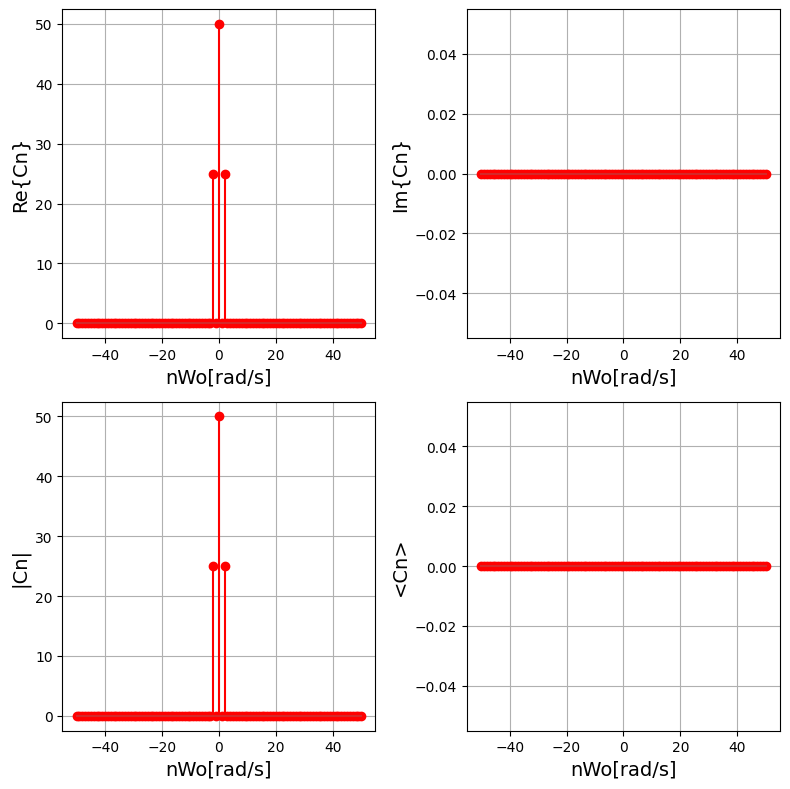

In [ ]:
#graficar espectro
fig = plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
plt.stem(nv, np.real(cn), 'r')
plt.xlabel(r'nWo[rad/s]',fontsize = 14)
plt.ylabel(r'Re{Cn}',fontsize = 14)
plt.axis('tight')
plt.grid()

plt.subplot(2,2,2)
plt.stem(nv, np.imag(cn), 'r')
plt.xlabel(r'nWo[rad/s]',fontsize = 14)
plt.ylabel(r'Im{Cn}',fontsize = 14)
plt.axis('tight')
plt.grid()

plt.subplot(2,2,3)
plt.stem(nv, abs(cn), 'r')#magnitud del espectro
plt.xlabel(r'nWo[rad/s]',fontsize = 14)
plt.ylabel(r'|Cn|',fontsize = 14)
plt.axis('tight')
plt.grid()

plt.subplot(2,2,4)
plt.stem(nv, np.angle(cn), 'r')#fase del espectro
plt.xlabel(r'nWo[rad/s]',fontsize = 14)
plt.ylabel(r'<Cn>',fontsize = 14)
plt.axis('tight')
plt.grid()

fig.tight_layout()

Este fragmento de código permite visualizar la reconstrucción de la señal original $ x(t) $ a partir de sus coeficientes de Fourier, comparando la señal reconstruida con la original.

- Se define la potencia total de la señal $ x(t) $ como `Px = 96`.  
- La función `pltest(Na=1)` permite ajustar el número de armónicos utilizados en la reconstrucción.  
  - Se seleccionan los coeficientes de Fourier dentro del rango $ [-N_a, N_a] $.  
  - Se calcula el error relativo de reconstrucción $ E_r $, basado en la energía de los coeficientes utilizados.  
  - Se reconstruye la señal sumando las contribuciones de las bases de Fourier ponderadas por sus coeficientes (`xe`).  
- Se grafica la señal reconstruida en azul y la señal original en rojo para comparación.  
- Se muestra el error relativo $ E_r $ en el título de la gráfica.  
- Se usa `interact(pltest, Na=(1,N,1))` para generar un control deslizante que permite variar el número de armónicos utilizados en la reconstrucción, facilitando el análisis visual de cómo cambia la aproximación conforme se agregan más términos.  

Este análisis ayuda a comprender la convergencia de la serie de Fourier y el impacto de los armónicos en la reconstrucción de señales.

/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.11/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


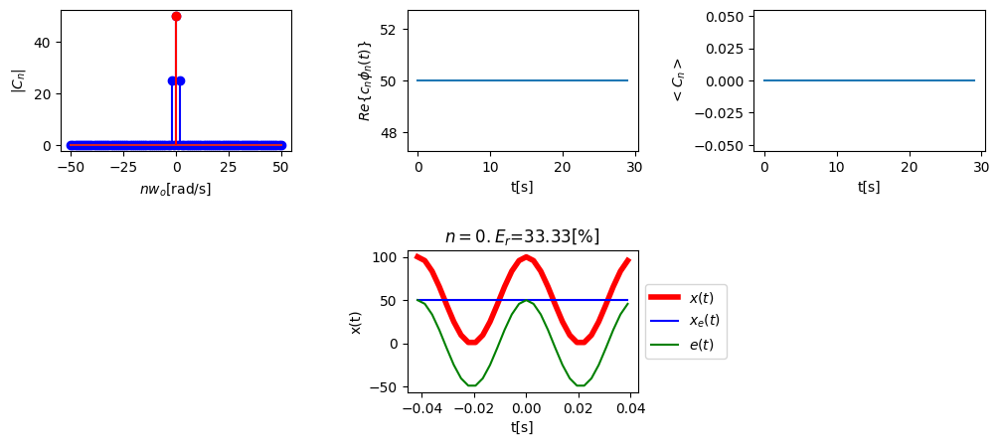

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
from matplotlib import animation, rc
from IPython.display import HTML

#reconstrucción
Px = ((3/8) * A**4)
#figura y axes animaciónx
fig, ax = plt.subplots(2, 3,figsize=(12,5))
#función para gráfico interactivo
def update(n):
    #actualización regresor Bayesiano
    #Graficar prior
    ax[0,0].clear()
    ax[0,1].clear()
    ax[0,2].clear()
    ax[1,0].clear()
    ax[1,1].clear()
    ax[1,2].clear()

    #espectro
    ind = np.arange(N-n,N+n+1) #armónicos a considerar

    # Use cn instead of Cn
    ax[0,0].stem(nv, abs(cn), 'b')#magnitud del espectro
    ax[0,0].stem(nv[ind], abs(cn[ind]), 'r')#magnitud del espectro

    ax[0,0].set_xlabel(r'$nw_o$[rad/s]')
    ax[0,0].set_ylabel(r'$|C_n|$')

    #componentes espectrales
    # Use cn instead of Cn
    ce = phin[:,ind].dot(np.diag(cn[ind]))
    ax[0,1].plot(np.real(ce))#componente real
    ax[0,1].set_xlabel('t[s]')
    ax[0,1].set_ylabel('$Re\{c_n\phi_n(t)\}$')

    ax[0,2].plot(np.imag(ce))#componente imaginario
    ax[0,2].set_xlabel('t[s]')
    ax[0,2].set_ylabel('$<C_n>$')

    #reconstruccion
    # Use cn instead of Cn
    er = 1- np.sum(abs(cn[ind])**2)/Px
    #señal reconstruida
    # Use cn instead of Cn
    xe = phin[:,ind].dot(cn[ind] ) # dot calcula el producto entre vectores
    #error en t
    et = xo - xe

    ax[1,1].plot(tv,xo,'r',linewidth=4,label='$x(t)$')
    ax[1,1].plot(tv,xe,color='b',label='$x_e(t)$') # señal estimada o filtrada
    ax[1,1].plot(tv,et,color='g',label='$e(t)$') # señal estimada o filtrada
    ax[1,1].set_title('$n=%d. E_r$=%.2f[%%]' % (n,100*er))
    ax[1,1].set_xlabel('t[s]')
    ax[1,1].set_ylabel('x(t)')
    ax[1,1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax[1,0].axis('off')
    ax[1,2].axis('off')
    plt.subplots_adjust(wspace=0.5,hspace=0.7)
    plt.show()

#desplegar animación
anim = animation.FuncAnimation(fig, update, frames=np.arange(0,N+1,1), blit=False)
rc('animation', html='jshtml')

anim

# **PREGUNTA 2**

Este código permite descargar el audio de un video de YouTube en formato MP3 utilizando la biblioteca `yt-dlp`. Primero, instala las dependencias necesarias, incluyendo `yt-dlp`, que se obtiene directamente desde su repositorio en GitHub, y `soundfile`, aunque en este fragmento de código no se utiliza. Luego, importa las librerías `os` y `yt_dlp`, siendo esta última la encargada de manejar la descarga de videos y audios.   

A continuación, define la función `download_ytvid_as_mp3(video_url, name)`, que toma como entrada la URL de un video de YouTube y el nombre que se desea asignar al archivo de salida. La función extrae la información del video sin descargarlo, construye el nombre del archivo de salida en formato MP3 y configura las opciones de descarga para obtener solo el audio con la mejor calidad disponible. Posteriormente, emplea `yt_dlp.YoutubeDL(options)` para ejecutar la descarga y guardar el archivo con el nombre especificado. Finalmente, muestra un mensaje en consola indicando que la descarga ha finalizado exitosamente.


In [ ]:
#instalar librerias necesarias para descargar audios youtube
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
!pip install soundfile

import os
import yt_dlp as youtube_dl

#funcion para descargar mp3 desde youtube
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 26.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.1.26-py3-none-any.whl size=2927579 sha256=fed69211ff1848680e4cd232aaba73eb388facf6fefb7d379d886e9d8f19385d
  Stored in directory: /tmp/pip-ephem-wheel-cache-p84xncf_/wheels/2d/79/97/7209650ef73114e0fe0603480da012ad3afacb9cae6b8acd9a
Successfully built yt-dlp
  Attempting uninstall: yt-dlp
    Found existing installation: yt-dlp 2025.1.26
    Uninstalling yt-dlp-2025.1.26:
      Successfully uninstalled yt-dlp-2025.1.26


Este fragmento de código permite descargar un archivo desde Google Drive utilizando su identificador único (`FILEID`). Primero, define el ID del archivo a descargar y luego ejecuta un comando `wget` para obtenerlo.  
  
El comando `wget` maneja las cookies necesarias para autorizar la descarga, evitando restricciones de Google Drive. Utiliza una doble solicitud: la primera obtiene un código de confirmación, y la segunda lo usa para completar la descarga.  

El archivo descargado se guarda con el nombre `canciones.xlsx`. Finalmente, se ejecuta el comando `!dir` para listar los archivos en el directorio actual. Se incluye una línea comentada para descomprimir un archivo en caso de que se necesite (`unzip -o codigos.zip`), pero no se ejecuta en este caso.


In [ ]:
#cargar datos desde drive acceso libre
FILEID = "1DxI5wQpqEWksw2BqJnG7n0IgNQ_xByX-"

!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O  canciones.xlsx && rm -rf /tmp/cookies.txt
#!unzip -o codigos.zip
!dir

--2025-01-27 20:18:09--  https://docs.google.com/uc?export=download&confirm=&id=1DxI5wQpqEWksw2BqJnG7n0IgNQ_xByX-
Resolving docs.google.com (docs.google.com)... 142.250.145.100, 142.250.145.101, 142.250.145.138, ...
Connecting to docs.google.com (docs.google.com)|142.250.145.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1DxI5wQpqEWksw2BqJnG7n0IgNQ_xByX-&export=download [following]
--2025-01-27 20:18:09--  https://drive.usercontent.google.com/download?id=1DxI5wQpqEWksw2BqJnG7n0IgNQ_xByX-&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.128.132, 2a00:1450:4013:c02::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.128.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9263 (9.0K) [application/octet-stream]
Saving to: ‘canciones.xlsx’

canciones.xlsx      100%[===================>]   9.05K  --.

Este código importa las bibliotecas necesarias para el análisis de datos y visualización: `pandas` para la manipulación de datos, `numpy` para cálculos numéricos y `matplotlib.pyplot` para la generación de gráficos.  

Luego, define la variable `file_`, que almacena el nombre del archivo `canciones.xlsx`. Finalmente, usa `pd.read_excel(file_)` para leer el archivo de Excel y cargar su contenido en la variable `X`, permitiendo su posterior análisis y procesamiento.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file_ = 'canciones.xlsx'#leer archivo xlsx con link, band, type
X  = pd.read_excel(file_)

Este fragmento de código tiene como objetivo crear una carpeta de resultados, recorrer un archivo Excel que contiene información sobre videos y realizar operaciones de descarga y conversión de audio.  
  
Primero, intenta crear una carpeta llamada `results` para guardar los archivos descargados y procesados. Si la carpeta ya existe, muestra un mensaje indicándolo.  

Luego, el código obtiene el número de filas y columnas del archivo Excel cargado previamente y calcula la cantidad de segmentos por canción (`Ns`). Posteriormente, recorre las filas del archivo Excel (en este caso, solo trabaja con el primer video) y extrae el enlace, banda y tipo de cada video.  

El nombre del archivo resultante se construye combinando el nombre de la banda, el número del video y el tipo musical, y se utiliza para descargar el video desde YouTube mediante la función `download_ytvid_as_mp3`.  

Finalmente, usa el comando `subprocess.call` para convertir el archivo MP3 descargado a formato WAV utilizando la herramienta `ffmpeg`, guardando el resultado en la misma carpeta `results`.


In [ ]:
import subprocess
import os

#crear carpeta con resultados
try:
  os.mkdir('results')
except:
  print("Carpeta results ya existe")

#recorrer excel con videos
N, P = X.shape
Ns = N * 5 #cantidad de segmentos por cancion
n = 0
print(f"video {n+1} de {N}")
print(f"link: {X.loc[n,'link']}\n")
print(f"band: {X.loc[n,'band']}\n")
print(f"type: {X.loc[n,'type']}\n")
#ruta video n-th
name_ = 'results/'+X.loc[n,'band']+"_"+str(n)+"_"+str(X.loc[n,'type_num']) # #video+nombre+tipo de genero musical
#descargar mp3 desde youtube
download_ytvid_as_mp3(X.loc[n,'link'],name_)
#convertir a .wav
subprocess.call(['ffmpeg','-y', '-i', name_+'.mp3',
                name_+'.wav'])

video 1 de 16
link: https://www.youtube.com/watch?v=WdoXZf-FZyA&ab_channel=Megadeth-Topic

band: megadeth

type: metal

[youtube] Extracting URL: https://www.youtube.com/watch?v=WdoXZf-FZyA&ab_channel=Megadeth-Topic
[youtube] WdoXZf-FZyA: Downloading webpage
[youtube] WdoXZf-FZyA: Downloading tv client config
[youtube] WdoXZf-FZyA: Downloading player 37364e28
[youtube] WdoXZf-FZyA: Downloading tv player API JSON
[youtube] WdoXZf-FZyA: Downloading ios player API JSON
[youtube] WdoXZf-FZyA: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=WdoXZf-FZyA
[youtube] WdoXZf-FZyA: Downloading webpage
[youtube] WdoXZf-FZyA: Downloading tv client config
[youtube] WdoXZf-FZyA: Downloading player 37364e28
[youtube] WdoXZf-FZyA: Downloading tv player API JSON
[youtube] WdoXZf-FZyA: Downloading ios player API JSON
[youtube] WdoXZf-FZyA: Downloading m3u8 information
[info] WdoXZf-FZyA: Downloading 1 format(s): 251
[download] Destination: results/megadeth_0_1.mp3
[d

0

Este fragmento de código tiene como objetivo cargar los archivos de audio en formato `.wav` y listarlos para su posterior procesamiento.  

Primero, define la variable `path` que contiene la ruta de la carpeta `results/`, donde se encuentran los archivos `.wav` generados previamente. Luego, utiliza una comprensión de lista para recorrer los archivos de la carpeta y seleccionar solo aquellos que tienen la extensión `.wav`. El resultado se guarda en la lista `wav_files`. Finalmente, muestra la lista de archivos `.wav` encontrados en la carpeta `results/`.


In [ ]:
#cargar .wavs y partir audios
#lista archivos .wav
path = 'results/'
wav_files = [f for f in os.listdir(path) if f.endswith('.wav')]
wav_files

['megadeth_0_1.wav']

Este comando instala la biblioteca `soundfile` en el entorno de Python. `soundfile` es una librería utilizada para leer y escribir archivos de audio en varios formatos, como WAV y FLAC. La instalación se realiza mediante el gestor de paquetes `pip`, y al ejecutar este comando, se asegura que `soundfile` esté disponible para su uso en el código posterior.


In [ ]:
!pip install soundfile #instalar sondfile

Este fragmento de código tiene como objetivo leer los archivos de audio `.wav` de la carpeta `results/`, segmentarlos en partes específicas de tiempo y almacenarlos en un arreglo de `numpy`.  

Primero, se establece una frecuencia de muestreo `fs` de 48,000 Hz y un vector `tl` que contiene el tiempo inicial de los segmentos a extraer (en este caso, 20 segundos). Luego, se define el tamaño de cada segmento (`ts`) en 5 segundos y se calcula la cantidad total de segmentos (`Ns`) multiplicando el número de archivos `.wav` por la longitud de `tl`.  
  
Se crea una matriz `x_t` de ceros, que contendrá los segmentos de audio extraídos, con dimensiones correspondientes a `Ns` segmentos, la cantidad de muestras por segmento, y dos canales (estéreo). También se define un vector `label` para almacenar la etiqueta del tipo de género musical y una lista `name_c` para los nombres de los archivos sin la extensión.  

El bucle recorre los archivos `.wav` en la carpeta `results/`, lee cada archivo con `soundfile.read()` y extrae los segmentos de audio en función de los tiempos definidos en `tl`. Los segmentos se almacenan en la matriz `x_t`, y se asigna una etiqueta a cada segmento según el nombre del archivo (el género musical se extrae del penúltimo carácter del nombre del archivo). Finalmente, se imprime información sobre la lectura y el segmento procesado en cada iteración.  
  
Al finalizar, se muestra la forma (dimensiones) de la matriz `x_t` para verificar la correcta carga y segmentación de los archivos de audio.


In [ ]:
import soundfile as sf # para instalar pip install soundfile
#leer archivos y crear np.array audios
fs = 48000
tl = np.array([20])
ts = 5 #t segmento
Ns = len(wav_files)*len(tl) #cantidad segmentos
x_t = np.zeros((Ns,int(ts*fs),2)) #Ns segmentos, cantidad de muestras, 2 canales (stereo)
label = np.zeros((Ns,1)) #vector tipo de genero
name_c = []
#leer archivos wav
i = 0
for name in wav_files:#lectura audio .wav
    x, fs = sf.read(path+name)
    for ti in tl: #segmentos de tiempo
        x_t[i] = x[int(fs*ti):int(fs*(ti+ts)),:]
        label[i] = int(name[-5]) #tipo de genero
        name_c += [name[:-6]]
        print(f"{i} lectura: {name}; segundo {ti}:{ti+ts}; tipo música {label[i]}")
        i+=1
x_t.shape

0 lectura: megadeth_0_1.wav; segundo 20:25; tipo música [1.]


(1, 240000, 2)

Este fragmento de código permite reproducir un segmento de audio a partir de la matriz `x_t`.  

Primero, importa la función `Audio` desde la librería `IPython.display`, que es útil para reproducir archivos de audio en entornos interactivos, como Jupyter Notebooks. Luego, utiliza `Audio(x_t[0].T, rate=fs)` para reproducir el primer segmento de audio almacenado en `x_t`. El índice `0` hace referencia al primer segmento, y la transposición `.T` asegura que los datos de audio estén en la forma adecuada para ser reproducidos (ya que `x_t` tiene dos canales, uno para cada altavoz en estéreo). La frecuencia de muestreo `fs` se establece en 48,000 Hz, lo que permite reproducir el audio a la tasa correcta.


In [ ]:
from IPython.display import Audio #reproducir segmento
Audio(x_t[0].T,rate=fs)

Este fragmento de código selecciona el primer canal de audio del primer segmento en la matriz `x_t` para realizar un procesamiento posterior, como la modulación.  

Primero, se extrae el primer canal del primer segmento de audio en `x_t` utilizando el índice `[0,:,0]`, lo que selecciona todos los puntos de la primera dimensión (muestras) del primer segmento de audio y solo el primer canal (canal izquierdo, por ejemplo). El resultado se guarda en la variable `xm`. Finalmente, `xm.shape` se utiliza para mostrar las dimensiones de la señal extraída, permitiendo verificar que se haya realizado correctamente la selección del canal y las muestras.


In [ ]:
#tomamos canal 1 para generar la modulación
xm = x_t[0,:,0]
xm.shape

(240000,)

Este fragmento de código tiene como objetivo generar una señal portadora para la modulación.  
  
Primero, se define la frecuencia de la portadora `Fc` como 15,000 Hz y se crea un vector de tiempo `t` utilizando `np.arange()`, que abarca el intervalo de tiempo del segmento de audio (de 0 a `ts` segundos), con una resolución de muestreo definida por `fs` (48,000 Hz).  

Luego, se define un índice de modulación `Im` con un valor de 0.5, que se utiliza para calcular la amplitud de la portadora (`Ac`) con la fórmula `Ac = max(abs(xm)) / Im`, donde `max(abs(xm))` devuelve el valor máximo absoluto de la señal de audio, y el índice de modulación ajusta esta amplitud.  

Posteriormente, se genera la portadora `c` como una señal cosenoidal con la fórmula `c = Ac * np.cos(2 * np.pi * Fc * t)`, utilizando la amplitud calculada `Ac` y la frecuencia de portadora `Fc`. Esto crea una señal portadora que será utilizada en un esquema de modulación. Finalmente, se imprime el valor de `Ac`, que es la amplitud de la portadora.


In [ ]:
Fc = 15000 #frecuencia de portadora
t = np.arange(0,ts,1/fs) #vector del tiempo
Im = 0.5 # Im = peak(m(t))/Ac ->  Ac = peak(m(t))/Im

Ac = max(abs(xm))/Im #amplitud de la portadora según índice de modulación
c = Ac*np.cos(2*np.pi*Fc*t) #portadora
print(Ac)

[ 2.         -0.76536686 -1.41421356 ...  1.84775907 -1.41421356
 -0.76536686]
2.0


Este fragmento de código genera y muestra una gráfica de la señal portadora y la señal de mensaje en función del tiempo.  

Se utilizan las funciones de `matplotlib` para crear la visualización. Primero, `plt.plot(t, c, label='portadora')` dibuja la señal portadora `c` en función del tiempo `t`, con la etiqueta "portadora" para la leyenda. Luego, `plt.plot(t, xm, label='mensaje')` dibuja la señal de mensaje `xm` (el primer canal del audio) en función del mismo vector de tiempo `t`, con la etiqueta "mensaje" en la leyenda.  

Se añaden etiquetas a los ejes utilizando `plt.xlabel('t [s]')` y `plt.ylabel('Amplitud')` para indicar que el eje x representa el tiempo en segundos y el eje y la amplitud de las señales. Finalmente, `plt.legend()` se utiliza para mostrar la leyenda en la gráfica, y `plt.show()` muestra la gráfica resultante.


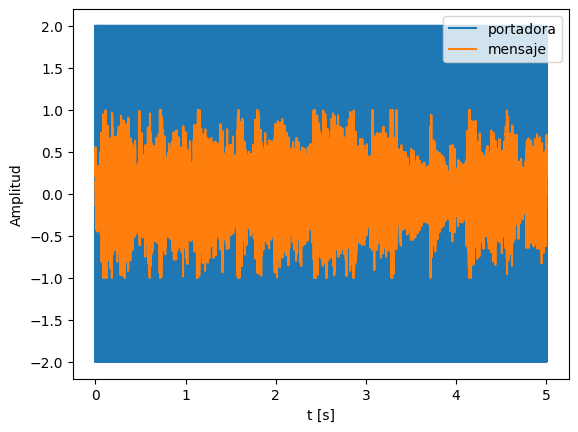

In [ ]:
plt.plot(t,c,label='portadora')
plt.plot(t,xm,label='mensaje')
plt.xlabel('t [s]')
plt.ylabel('Amplitud')
plt.legend()
plt.show()

Este fragmento de código se utiliza para reproducir la señal portadora generada previamente.  

Se utiliza la función `Audio(c, rate=fs)` de `IPython.display` para reproducir la señal `c` (la portadora), con una tasa de muestreo de `fs` (48,000 Hz). La función `Audio` convierte la señal en formato de audio para que pueda ser reproducida directamente en entornos interactivos como Jupyter Notebooks. El parámetro `rate=fs` asegura que la señal se reproduzca con la frecuencia de muestreo adecuada, manteniendo la calidad original de la señal generada.


In [ ]:
Audio(c,rate=fs) #reproducir portadora

Este fragmento de código genera la señal modulada en amplitud (AM) y la visualiza en función del tiempo.  

La señal modulada `y` se calcula mediante la fórmula $\ y(t) = \left( 1 + \frac{x_m}{A_c} \right) c $, donde `xm` es la señal de mensaje (el primer canal del audio), `Ac` es la amplitud de la portadora, y `c` es la portadora generada previamente. La expresión modula la amplitud de la portadora en función del mensaje.  

Después, se utiliza `plt.plot(t, y)` para graficar la señal modulada `y` en función del tiempo `t`. Se añaden etiquetas a los ejes con `plt.xlabel('$t[s]$')` para el tiempo en segundos y `plt.ylabel('$y(t)$')` para la señal modulada. Finalmente, `plt.show()` muestra la gráfica resultante de la señal modulada.


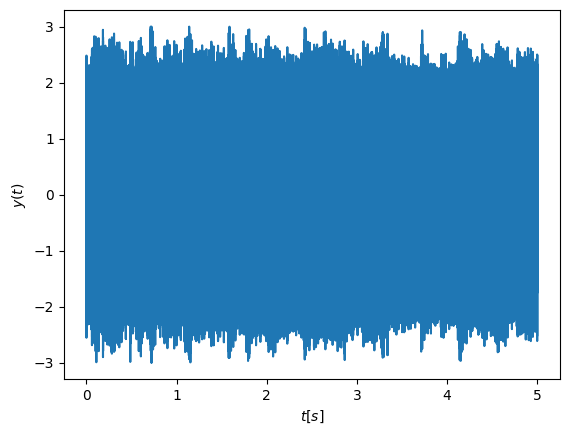

In [ ]:
y = (1+xm/Ac)*c #señal modulada en AM
plt.plot(t,y)
plt.xlabel('$t[s]$')
plt.ylabel('$y(t)$')
plt.show()

Este fragmento de código se utiliza para reproducir la señal modulada en amplitud (AM) generada previamente.  

Se utiliza la función `Audio(y, rate=fs)` de `IPython.display` para reproducir la señal modulada `y`, con una tasa de muestreo de `fs` (48,000 Hz). Al igual que en el caso de la portadora, la función `Audio` convierte la señal en formato de audio para que pueda ser reproducida directamente en entornos interactivos como Jupyter Notebooks. El parámetro `rate=fs` asegura que la señal se reproduzca con la frecuencia de muestreo adecuada, manteniendo la calidad original de la señal modulada.


In [ ]:
Audio(y,rate=fs) #reproducir modulada

Este fragmento de código calcula y visualiza los espectros de frecuencia de la portadora, la señal de mensaje y la señal modulada en amplitud (AM).  

Se utilizan las funciones de la librería `numpy.fft` para calcular las transformadas rápidas de Fourier (FFT) de las señales. `Xfc = np.fft.fft(c)` calcula la FFT de la señal portadora `c`, `Xfm = np.fft.fft(xm)` calcula la FFT de la señal de mensaje `xm`, y `Xfy = np.fft.fft(y)` calcula la FFT de la señal modulada `y`.  

La función `np.fft.fftfreq(len(c), 1/fs)` se utiliza para calcular las frecuencias correspondientes a las componentes espectrales de las señales, donde `fs` es la frecuencia de muestreo.  

Finalmente, se generan tres gráficos de las magnitudes de las transformadas de Fourier de las tres señales utilizando `plt.plot()`. Se trazan las magnitudes de `Xfy`, `Xfm` y `Xfc` en función de las frecuencias `vfre`. Se añaden etiquetas a la leyenda con `plt.legend()`, y las etiquetas de los ejes son añadidas con `plt.xlabel('$f [Hz]$')` para la frecuencia en Hz y `plt.ylabel('$|X(f)|$')` para la magnitud de las componentes espectrales. El rango del eje y se ajusta con `plt.ylim([min(abs(Xfm)), 1.1*max(abs(Xfm))])` para centrarse en las frecuencias relevantes. Finalmente, `plt.show()` muestra la gráfica resultante.


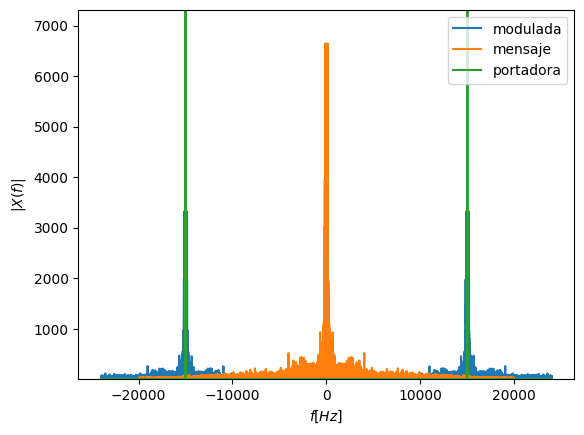

In [ ]:
#calculo de espectros
Xfc = np.fft.fft(c)
Xfm = np.fft.fft(xm)
Xfy = np.fft.fft(y)

vfre = np.fft.fftfreq(len(c),1/fs)

plt.plot(vfre,abs(Xfy),label='modulada')
plt.plot(vfre,abs(Xfm),label='mensaje')
plt.plot(vfre,abs(Xfc),label='portadora')
plt.legend()
plt.xlabel('$f [Hz]$')
plt.ylabel('$|X(f)|$')
plt.ylim([min(abs(Xfm)), 1.1*max(abs(Xfm))])
plt.show()

# **PREGUNTA 3**

**Consulte en que consiste la distorsión total de armónicos (Total Harmonic Distortion-(THD)) y el factor de potencia en un circuito eléctrico. Como puede calcularse el THD desde la FFT?. Como puede calcularse la distorsión del factor de potencia con base al THD?. Genere un ejemplo ilustrativo para el cálculo del THD y la distorsión del factor de potencia para un rectificador de onda completa con carga: i) netamente resistiva y ii) carga RC en serie. Establezca las condiciones necesarias para las simulaciones. El usuario podrá escoger diferentes valores de R y C.**

**Distorsión Total de Armónicos:** La Distorsión Total de Armónicos (THD, por sus siglas en inglés: Total Harmonic Distortion) es una medida de la distorsión que afecta a una señal debido a la presencia de armónicas. Las armónicas son componentes de frecuencia múltiplos enteros de la frecuencia fundamental de una señal. En un sistema eléctrico ideal, las señales de voltaje y corriente son senoidales (es decir, tienen solo una frecuencia fundamental). Sin embargo, debido a la no linealidad de algunos equipos, como rectificadores, motores o dispositivos electrónicos, se generan armónicas que distorsionan la forma de onda original.

El THD se calcula como la relación entre la potencia de las armónicas y la potencia de la frecuencia fundamental. De manera más formal, el THD es:

$$THD = \frac{\sqrt{A_2^2 + A_3^2 + A_4^2 + \dots}}{A_1}$$

Donde:

- $A_1$ es la amplitud de la frecuencia fundamental (la frecuencia más baja).
- $A_n$ son las amplitudes de las armónicas (componentes de frecuencias múltiplos de la frecuencia fundamental).

El THD se expresa como un porcentaje, y cuanto mayor es el THD, mayor es la distorsión de la señal. Un THD bajo indica que la señal es muy parecida a una onda sinusoidal ideal, mientras que un THD alto sugiere una mayor distorsión, lo que puede llevar a una mayor generación de calor y pérdidas de eficiencia en equipos eléctricos.

-------------------------------

**Factor de Potencia (FP):** El factor de potencia es una medida de la eficiencia con la que un circuito eléctrico utiliza la energía suministrada. En términos sencillos, es la relación entre la potencia activa (o real) $P$ y la potencia aparente $S$, y se expresa como:

$$FP = \frac{P}{S} = \cos(\theta)$$

Donde:

- **P** es la potencia activa (en vatios), que es la energía que realiza trabajo útil en el circuito (por ejemplo, mueve un motor o ilumina una lámpara).
- **S** es la potencia aparente (en voltamperios), que es la potencia total suministrada al circuito, que incluye tanto la potencia activa como la potencia reactiva (debida a componentes inductivos y capacitivos).
- **θ** es el ángulo de desfase entre la corriente y el voltaje.

El factor de potencia tiene un valor entre 0 y 1, y es más cercano a 1 cuando la corriente y el voltaje están alineados en fase (como en una carga resistiva pura). Un factor de potencia bajo indica una mayor presencia de potencia reactiva, lo que significa que parte de la energía no se está utilizando de manera efectiva.

---------------------

Para calcular el THD desde la FFT, se realiza el siguiente proceso:

1. Aplicar la FFT a la señal para obtener las amplitudes de las frecuencias presentes.
2. Identificar la frecuencia fundamental $A_1$ y las armónicas $A_2$, $A_3$, $A_4$, ....

----------------------

El THD (Distorsión Total de Armónicos) puede afectar el factor de potencia en un circuito eléctrico, ya que las armónicas introducen un desfase adicional entre la corriente y el voltaje. Un mayor THD generalmente indica una mayor distorsión, lo que reduce el factor de potencia.

Relación entre THD y el factor de potencia:
El factor de potencia distorsionado (FP
distorsionado) se puede calcular aproximando la fórmula:

$$FP_{distorsionado} \approx \frac{FP_{ideal}}{\sqrt{1 + THD^2}}$$

Donde:

- FP ideal es el factor de potencia sin armónicas (idealmente 1).
-THD es la distorsión total de armónicos en la señal (como un valor decimal).

>EJEMPLO RESISTIVO

Este fragmento de código importa varios paquetes necesarios para realizar simulaciones y análisis numéricos en Python.  

- **`numpy`**: Se utiliza para la manipulación de arrays y operaciones matemáticas en general.  
- **`scipy`**: Contiene funciones y algoritmos adicionales para la computación científica, especialmente en el ámbito de señales, optimización y estadísticas.  
- **`matplotlib.pyplot`**: Es una biblioteca para la visualización de datos en gráficos.  
- **`scipy.signal`**: Se utiliza para trabajar con señales, incluyendo filtros, transformadas, y análisis de señales.  
- **`scipy.optimize`**: Proporciona métodos para la optimización de funciones, útil para encontrar valores que minimicen o maximicen una función objetivo.  
- **`sympy`**: Se utiliza para el cálculo simbólico, permitiendo la manipulación de expresiones matemáticas de manera algebraica. Aunque se encuentra importado en el código, no se está utilizando activamente en este fragmento, y la línea de inicialización `sym.init_session()` está comentada.

In [ ]:
#paquetes de para simulación
import numpy as np
import scipy
import matplotlib.pyplot as plt
#%matplotlib inline
import scipy.signal as sig
import scipy.optimize as opt
#from IPython.display import Image
import sympy as sym
#sym.init_session()

Este código define y representa un sistema resistivo en el dominio de Laplace utilizando la librería `sympy` de Python, que permite trabajar con matemáticas simbólicas. Primero, se importan las herramientas necesarias de `sympy` y se definen las variables simbólicas `s` (la variable compleja en el dominio de Laplace) y `R` (la resistencia del circuito, que es una constante positiva). Luego, se crea una función simbólica `X(s)`, que representa la entrada del sistema en el dominio de Laplace. La salida del sistema, `Y(s)`, se define como el producto de $ \frac{1}{R} $ por la entrada `X(s)`, lo que refleja una relación directa y lineal en un sistema resistivo. Finalmente, se muestra la función de transferencia $Y(s) = \frac{1}{R} \cdot X(s)$, que representa cómo la salida está relacionada con la entrada en el dominio de Laplace. Este modelo es una simplificación de un circuito resistivo, donde la salida es una versión escalada de la entrada por el factor \( \frac{1}{R} \).


In [ ]:
s = sym.symbols('s', complex=True)
t, R, L, C = sym.symbols('t R L C', positive=True)
X = sym.Function('X')(s)

Y = (1 / R) * X
Y

X(s)/R

Este código realiza una sustitución simbólica en la expresión de la salida \( Y(s) \) que definimos previamente. Aquí están los pasos:

- Se asigna el valor de 1000 a la variable `R_v`, que representa el valor de la resistencia en la simulación.
- Luego, la expresión simbólica de $ Y(s) $, que contiene la variable \( R \), se evalúa sustituyendo \( R \) por el valor de `R_v` (1000) utilizando el método `subs` de `sympy`.
- Finalmente, la expresión resultante, que ahora tiene el valor numérico de \( R \), se guarda en la variable `Y_RC`.

In [ ]:
R_v = 1000 #valores de simulacion de R
Y_RC = Y.subs(R, R_v)
Y_RC

X(s)/1000

Este código define una función de transferencia en el dominio de Laplace para un sistema resistivo, y realiza los siguientes pasos:

- **Coeficientes del Numerador (`num`)**:
   - Se define un arreglo de coeficientes para el numerador de la función de transferencia. En este caso, el numerador es simplemente un valor constante de 1, que corresponde a un sistema de ganancia unitaria.

- **Coeficientes del Denominador (`den`)**:
   - Se define un arreglo de coeficientes para el denominador de la función de transferencia. El denominador se define como un arreglo que contiene el valor de \( R_v \) (resistencia de la simulación) seguido de un 1. Este formato corresponde a una función de transferencia de la forma \( \frac{1}{R \cdot s + 1} \), donde \( R \) es la resistencia.

- **Creación de la Función de Transferencia (`G_n`)**:
   - Se utiliza la librería `scipy.signal` (`sig`) para crear la función de transferencia utilizando los coeficientes del numerador y el denominador definidos anteriormente. El objeto `G_n` es ahora la representación del sistema en el dominio de Laplace.

- **Impresión de los Coeficientes**:
   - Se imprimen los coeficientes del numerador (`num`) y del denominador (`den`) para verificar que se han definido correctamente.

In [ ]:
num = np.array([1]) #coeficientes del numerador de la funcion de transferencia como numpy array
den = np.array([R_v,1])#coeficientes del denominador de la funcion de transferencia como numpy array
G_n = sig.TransferFunction(num, den) #funcion de transferencia en
print(num)
print(den)

[1]
[1000    1]


Este código simula la señal de entrada y salida de un sistema con un rectificador, utilizando un sistema de transferencia definido previamente.

- **Parámetros de la señal de entrada:**
   - `Fo = 60`: Se define la frecuencia de alimentación de la señal (60 Hz).
   - `Fs = 30 * Fo`: La frecuencia de muestreo se define como 30 veces la frecuencia de alimentación (1800 Hz).
   - `To = 1 / Fo`: El periodo fundamental de la señal es el inverso de la frecuencia de alimentación.
   - `Ts = 1 / Fs`: El periodo de muestreo es el inverso de la frecuencia de muestreo.
   - `t = np.arange(0, 5*To, Ts)`: Se genera un vector de tiempo `t` que abarca 5 periodos de la señal de alimentación, con un muestreo a intervalos de `Ts`.

- **Generación de la señal de entrada:**
   - `A = 120`: La amplitud de la señal de entrada es 120 V.
   - `in_o = A * (np.sin(2 * np.pi * Fo * t))`: Se crea una onda senoidal con la frecuencia de alimentación `Fo` y la amplitud `A`.
   
- **Generación de la señal rectificada:**
   - `rec_c = sig.square(2 * np.pi * Fo * t)`: Se genera un tren de pulsos cuadrado a la frecuencia de alimentación para simular la rectificación completa.
   - Para un **rectificador de media onda**: `rec_m = 0.5 * (sig.square(2 * np.pi * Fo * t) + 1)`, que produce una señal que solo se activa en la mitad del ciclo de la onda.
   - `in_ = in_o * rec_c`: Se calcula la señal de entrada rectificada completa multiplicando la onda senoidal `in_o` por el tren de pulsos `rec_c`. Si se quiere probar con rectificador de media onda, se usaría `rec_m` en lugar de `rec_c`.

- **Evaluación de la salida del sistema:**
   - `out = G_n.output(in_, T=t)[1]`: Se evalúa la salida del sistema (definido por `G_n`) a la señal de entrada rectificada utilizando la aproximación numérica de `scipy.signal`. La salida corresponde a la respuesta del sistema ante la entrada rectificada.



In [ ]:
Fo = 60 #frec alimentación
Fs = 30*Fo #frecuencia muestreo
To = 1/Fo #periodo fundamental
Ts = 1/Fs #periodo muestreo
t = np.arange(0, 5*To,Ts) # se simulan 5 peridos de alimentación con un muestreo segun Ts
A = 120 #amplitud entrada
#función de entrada aproximada como onda senoidal rectificada completa
in_o = A*(np.sin(2*np.pi*Fo*t))
rec_c = sig.square(2*np.pi*Fo*t)#función tren de pulsos para simular señal rectificada
#Para rectificador de media onda:
rec_m = 0.5*(sig.square(2*np.pi*Fo*t)+1)
in_ = in_o * rec_c #si se quiere probar con rec media onda multiplicar por rec_m
out = G_n.output(in_, T=t)[1] #evaluar salida ante entrada rectificada mediante aproximacion numérica de scipy

Este código genera una gráfica para visualizar la señal de alimentación (`in_o`), que es una onda senoidal. Utiliza la librería `matplotlib` para graficar.

- **`plt.plot(t, in_o, label='Alimentación')`:** Se traza la señal de entrada `in_o` con respecto al tiempo `t`, y se le asigna la etiqueta `'Alimentación'` en la leyenda.
   
- **`plt.legend()`:** Esto muestra la leyenda en la gráfica, la cual incluye la etiqueta definida en el paso anterior.

- **`plt.show()`:** Muestra la gráfica generada en pantalla, permitiendo ver la señal de alimentación.


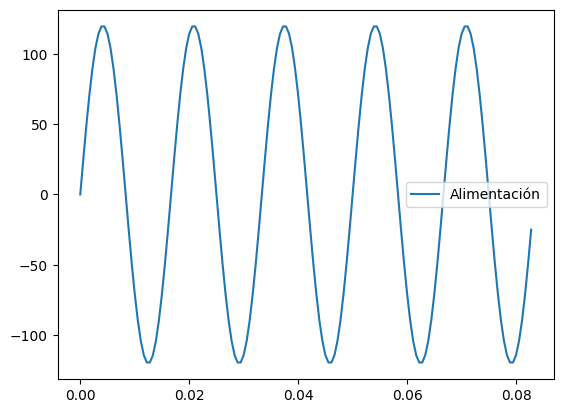

In [ ]:
#señales de alimentación y tren de pulsos
plt.plot(t,in_o,label='Alimentación')
plt.legend()
plt.show()

Este bloque de código genera una gráfica para visualizar el **tren de pulsos** (`rec_c`) en función del tiempo (`t`).

- **`plt.plot(t, rec_c, label='Tren Pulsos')`:** Se traza el tren de pulsos `rec_c` con respecto al tiempo `t`, y se le asigna la etiqueta `'Tren Pulsos'` en la leyenda.

- **`plt.legend()`:** Esto muestra la leyenda en la gráfica, que incluye la etiqueta definida en el paso anterior.

- **`plt.show()`:** Muestra la gráfica generada en pantalla, permitiendo observar el tren de pulsos a lo largo del tiempo.


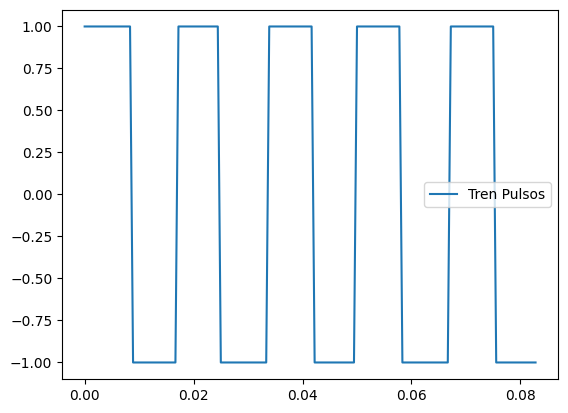

In [ ]:
plt.plot(t,rec_c,label='Tren Pulsos')
plt.legend()
plt.show()

Este bloque de código genera una gráfica que compara la **entrada rectificada** (`in_`) y la **salida del circuito** (`out`) en función del tiempo (`t`).

- **`plt.plot(t, in_, label='In(t)')`:** Se traza la entrada rectificada `in_` con respecto al tiempo `t` y se le asigna la etiqueta `'In(t)'` en la leyenda.

- **`plt.plot(t, out, label='Out(t)')`:** Se traza la salida del circuito `out` con respecto al tiempo `t` y se le asigna la etiqueta `'Out(t)'` en la leyenda.

- **`plt.xlabel('t [s]')`:** Se etiqueta el eje horizontal (tiempo) como `t [s]`.

- **`plt.ylabel('out(t)')`:** Se etiqueta el eje vertical (amplitud de la señal de salida) como `out(t)`.

- **`plt.show()`:** Muestra la gráfica generada en pantalla, permitiendo observar cómo varían tanto la entrada rectificada como la salida del circuito a lo largo del tiempo.


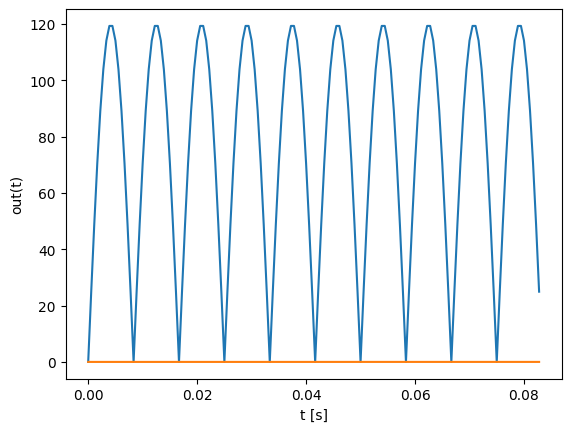

In [ ]:
plt.plot(t, in_,label='In(t)')#entrada rectificada
plt.plot(t, out,label='Out(t)')#salida del circuito
plt.xlabel('t [s]')
plt.ylabel('out(t)')
plt.show()

Este bloque de código realiza el **análisis espectral** de la salida del circuito utilizando la **Transformada Rápida de Fourier (FFT)** y grafica el **espectro de frecuencias** de la señal de salida (`out`).

- **`vfre = np.fft.rfftfreq(len(out), 1/Fs)`:** Calcula el vector de frecuencias (`vfre`) en Hertz, que depende del tamaño del vector de datos `out` y la frecuencia de muestreo `Fs`. Esta función devuelve las frecuencias para las cuales se computarán los componentes espectrales.

- **`Xf = np.fft.rfft(out)`:** Calcula la Transformada Rápida de Fourier (FFT) de la señal `out`, que es la salida del circuito. El uso de `rfft` es adecuado para señales reales, ya que solo devuelve la mitad positiva del espectro.

- **`plt.stem(vfre, abs(Xf / len(out)))`:** Utiliza `plt.stem` para graficar el espectro de frecuencias. Se muestra la magnitud de la FFT normalizada (`abs(Xf / len(out))`), lo que permite ver la distribución de energía en el dominio de la frecuencia.

- **`plt.xlabel('Frecuencia [Hz]')`:** Etiqueta el eje horizontal como `Frecuencia [Hz]`, que representa las frecuencias en Hertz.

- **`plt.ylabel('X(f)')`:** Etiqueta el eje vertical como `X(f)`, que representa la magnitud de la FFT (espectro de la señal).

- **`plt.show()`:** Muestra la gráfica generada, que permite visualizar cómo se distribuyen las componentes de frecuencia en la salida del circuito.

Este código proporciona una visualización de las frecuencias presentes en la señal de salida del circuito, lo que es útil para analizar las características espectrales del sistema.


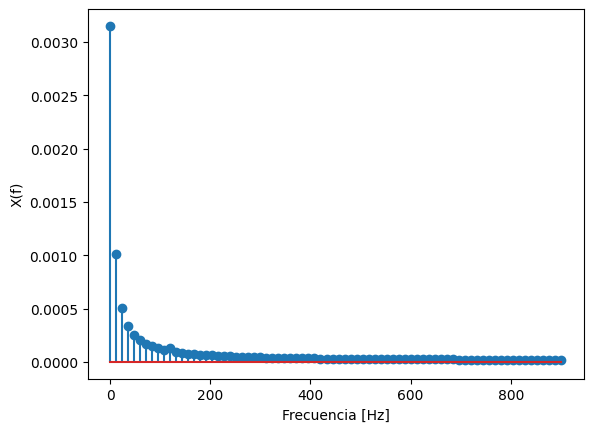

In [ ]:
vfre = np.fft.rfftfreq(len(out),1/Fs) #vector de frecuencia en Hz segun tamaño del vector y tiempo de muestreo
Xf = np.fft.rfft(out)

plt.stem(vfre,abs(Xf/len(out)))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('X(f)')
plt.show()

>EJEMPLO RESISTIVO CAPACITIVO

Este fragmento de código importa varios paquetes necesarios para realizar simulaciones y análisis numéricos en Python.  

- **`numpy`**: Se utiliza para la manipulación de arrays y operaciones matemáticas en general.  
- **`scipy`**: Contiene funciones y algoritmos adicionales para la computación científica, especialmente en el ámbito de señales, optimización y estadísticas.  
- **`matplotlib.pyplot`**: Es una biblioteca para la visualización de datos en gráficos.  
- **`scipy.signal`**: Se utiliza para trabajar con señales, incluyendo filtros, transformadas, y análisis de señales.  
- **`scipy.optimize`**: Proporciona métodos para la optimización de funciones, útil para encontrar valores que minimicen o maximicen una función objetivo.  
- **`sympy`**: Se utiliza para el cálculo simbólico, permitiendo la manipulación de expresiones matemáticas de manera algebraica. Aunque se encuentra importado en el código, no se está utilizando activamente en este fragmento, y la línea de inicialización `sym.init_session()` está comentada.


In [ ]:
#paquetes de para simulación
import numpy as np
import scipy
import matplotlib.pyplot as plt
#%matplotlib inline
import scipy.signal as sig
import scipy.optimize as opt
#from IPython.display import Image
import sympy as sym
#sym.init_session()

> Este fragmento de código utiliza la librería **`sympy`** para trabajar con cálculos simbólicos en Python.  

- Se define una variable compleja `s` como un símbolo, lo que permite su uso en expresiones algebraicas y ecuaciones diferenciales.  
- Luego, se definen los símbolos `t`, `R`, `L`, y `C` como variables positivas, que podrían representar tiempo, resistencia, inductancia y capacitancia, respectivamente.  
- **`X`** es una función simbólica en `s`, creada mediante `sym.Function('X')(s)`, que se representa como una función dependiente de la variable compleja `s`.  
- La variable **`Y`** se define como una expresión en términos de `X`, donde se realiza una relación simbólica en el dominio de Laplace. En esta expresión, se muestra una relación de transferencia de un circuito RC con la forma \( Y = \frac{1}{R C s + 1} \cdot X \).  
- Finalmente, la expresión de **`Y`** se evalúa y se muestra como salida.  


In [ ]:
s = sym.symbols('s', complex=True)
t, R, L, C = sym.symbols('t R L C', positive=True)
X = sym.Function('X')(s)

Y = 1/(R*C*s + 1) * X
Y

X(s)/(C*R*s + 1)

Este bloque de código realiza una **sustitución de valores numéricos** en la expresión simbólica previamente definida para **`Y`**.  

- **`R_v = 1000`**: Se asigna el valor 1000 a la resistencia \( R \) en ohmios, como parte de los valores de simulación.  
- **`C_v = 10e-6`**: Se asigna el valor \( 10 \times 10^{-6} \) a la capacitancia \( C \) en faradios, también para los fines de la simulación.  
- **`Y_RC = Y.subs(R, R_v).subs(C, C_v)`**: Se sustituyen los valores numéricos de \( R \) y \( C \) en la expresión simbólica de **`Y`**, reemplazando \( R \) por 1000 y \( C \) por $ 10 \times 10^{-6}$.  
- El resultado de esta sustitución es **`Y_RC`**, una expresión con valores numéricos, que representa la relación de transferencia del circuito con los valores específicos de \( R \) y \( C \).


In [ ]:
R_v = 1000 #valores de simulacion de R
C_v =  10e-6 # valores de simulacion de C
Y_RC = Y.subs(R, R_v).subs(C, C_v)
Y_RC


X(s)/(0.01*s + 1)

En este bloque de código, se define y se crea una **función de transferencia** utilizando la librería `scipy.signal`.  

- **`num = np.array([1])`**: Define un arreglo **`num`** con el coeficiente del numerador de la función de transferencia, en este caso solo tiene un valor \( 1 \).  
- **`den = np.array([R_v*C_v, 1])`**: Define un arreglo **`den`** que contiene los coeficientes del denominador de la función de transferencia. Utiliza los valores de \( R_v \) y \( C_v \) definidos previamente, de modo que el primer coeficiente es \( R_v \cdot C_v \) (el producto de la resistencia y la capacitancia), y el segundo coeficiente es \( 1 \).  
- **`G_n = sig.TransferFunction(num, den)`**: Crea una **función de transferencia** **`G_n`** utilizando los coeficientes del numerador y denominador previamente definidos.  
- El código luego imprime los coeficientes **`num`** y **`den`** en la consola, para verificar que los valores han sido asignados correctamente.


In [ ]:
num = np.array([1]) #coeficientes del numerador de la funcion de transferencia como numpy array
den = np.array([R_v*C_v,1])#coeficientes del denominador de la funcion de transferencia como numpy array
G_n = sig.TransferFunction(num, den) #funcion de transferencia en
print(num)
print(den)

[1]
[0.01 1.  ]


En este bloque de código se simula una señal de entrada para un sistema con una función de transferencia y se evalúa su salida. Los elementos clave son:

- **`Fo = 60`**: Define la **frecuencia de alimentación** de \( 60 \, \text{Hz} \).
- **`Fs = 30*Fo`**: Define la **frecuencia de muestreo** como 30 veces la frecuencia de alimentación, es decir, \( 1800 \, \text{Hz} \).
- **`To = 1/Fo`**: Calcula el **periodo fundamental** como el inverso de la frecuencia de alimentación.
- **`Ts = 1/Fs`**: Calcula el **periodo de muestreo** como el inverso de la frecuencia de muestreo.
- **`t = np.arange(0, 5*To, Ts)`**: Define un arreglo de tiempo **`t`** que simula 5 períodos de la señal de alimentación, con un muestreo según el periodo de muestreo **`Ts`**.
- **`A = 120`**: Define la **amplitud** de la señal de entrada como $120 \, \text{V} $.
- **`in_o = A*(np.sin(2*np.pi*Fo*t))`**: Define la señal de entrada aproximada como una **onda senoidal** de frecuencia \( Fo \) y amplitud \( A \).
- **`rec_c = sig.square(2*np.pi*Fo*t)`**: Define una señal de **tren de pulsos** como función cuadrada de la misma frecuencia que la señal de entrada.
- **`rec_m = 0.5*(sig.square(2*np.pi*Fo*t)+1)`**: Define la señal para un **rectificador de media onda**, que toma valores de \( 0 \) y \( 1 \) en función de la frecuencia de alimentación.
- **`in_ = in_o * rec_c`**: Multiplica la señal de entrada senoidal por la señal de tren de pulsos para obtener la señal rectificada completa (si se desea un rectificador de media onda, se debe multiplicar por **`rec_m`** en lugar de **`rec_c`**).
- **`out = G_n.output(in_, T=t)[1]`**: Evalúa la **salida** del sistema utilizando la función de transferencia **`G_n`**, considerando la entrada rectificada y utilizando la aproximación numérica de `scipy`.


In [ ]:
Fo = 60 #frec alimentación
Fs = 30*Fo #frecuencia muestreo
To = 1/Fo #periodo fundamental
Ts = 1/Fs #periodo muestreo
t = np.arange(0, 5*To,Ts) # se simulan 5 peridos de alimentación con un muestreo segun Ts
A = 120 #amplitud entrada
#función de entrada aproximada como onda senoidal rectificada completa
in_o = A*(np.sin(2*np.pi*Fo*t))
rec_c = sig.square(2*np.pi*Fo*t)#función tren de pulsos para simular señal rectificada
#Para rectificador de media onda:
rec_m = 0.5*(sig.square(2*np.pi*Fo*t)+1)
in_ = in_o * rec_c #si se quiere probar con rec media onda multiplicar por rec_m
out = G_n.output(in_, T=t)[1] #evaluar salida ante entrada rectificada mediante aproximacion numérica de scipy

Este código genera una gráfica que muestra la señal de alimentación (`in_o`), que es una onda senoidal rectificada completa, utilizando la librería `matplotlib` para graficar. En primer lugar, se crea la señal de alimentación a partir de una onda senoidal multiplicada por un tren de pulsos (`rec_c`), lo que produce una señal rectificada completa. Luego, `plt.plot(t, in_o, label='Alimentación')` se utiliza para trazar esta señal con respecto al tiempo (`t`), y se etiqueta como "Alimentación" en la leyenda de la gráfica. Finalmente, `plt.show()` muestra la gráfica resultante en pantalla.


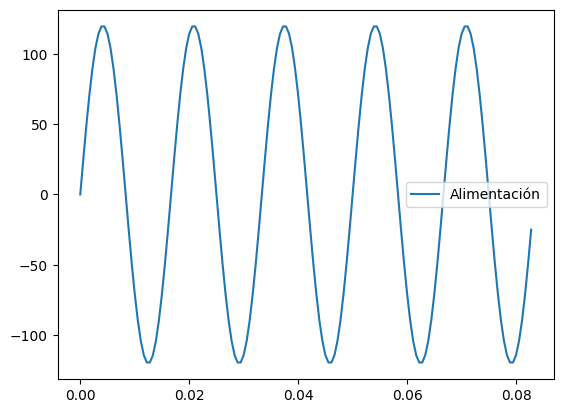

In [ ]:
#señales de alimentación y tren de pulsos
plt.plot(t,in_o,label='Alimentación')
plt.legend()
plt.show()

Este código genera una gráfica que muestra el tren de pulsos (`rec_c`) utilizando la librería `matplotlib`. La señal `rec_c` es una onda cuadrada que simula la rectificación completa de una señal. La función `plt.plot(t, rec_c, label='Tren Pulsos')` se utiliza para trazar esta señal en función del tiempo (`t`), y se etiqueta como "Tren Pulsos" en la leyenda de la gráfica. Finalmente, `plt.show()` muestra la gráfica resultante en pantalla.

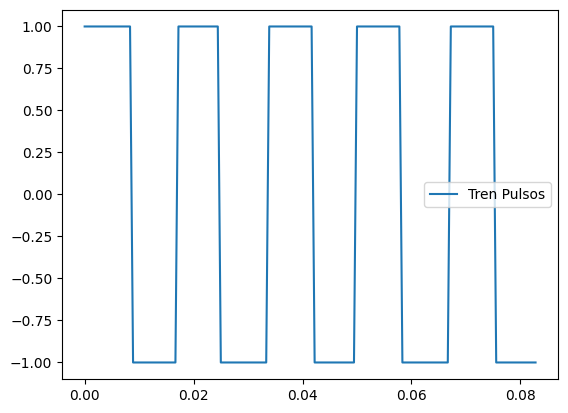

In [ ]:
plt.plot(t,rec_c,label='Tren Pulsos')
plt.legend()
plt.show()

Este código genera una gráfica que muestra tanto la señal de entrada rectificada (`in_`) como la salida del circuito (`out`) en función del tiempo. Se traza primero la señal de entrada (`in_`) utilizando `plt.plot(t, in_, label='In(t)')` y luego la señal de salida (`out`) con `plt.plot(t, out, label='Out(t)')`. Ambas señales se etiquetan adecuadamente en la leyenda de la gráfica. Las etiquetas de los ejes X e Y se configuran para indicar que el eje X representa el tiempo en segundos (`t [s]`) y el eje Y representa la salida del circuito (`out(t)`). Finalmente, `plt.show()` muestra la gráfica resultante en pantalla.


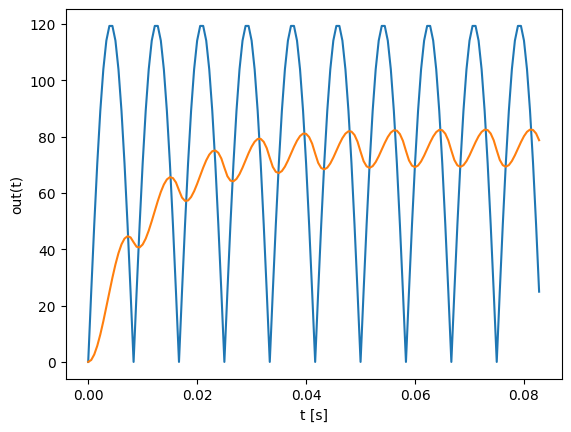

In [ ]:
plt.plot(t, in_,label='In(t)')#entrada rectificada
plt.plot(t, out,label='Out(t)')#salida del circuito
plt.xlabel('t [s]')
plt.ylabel('out(t)')
plt.show()

Este código realiza un análisis espectral de la señal de salida del circuito (`out`). Primero, se calcula el vector de frecuencias en Hertz (`vfre`) utilizando la función `np.fft.rfftfreq`, que genera un arreglo de frecuencias positivas según el tamaño de la señal de salida y el tiempo de muestreo (`1/Fs`). Luego, se calcula la transformada rápida de Fourier de la señal de salida (`Xf`) utilizando `np.fft.rfft`. Posteriormente, la gráfica de la magnitud del espectro de frecuencias se genera mediante `plt.stem`, donde se traza la magnitud de la transformada de Fourier normalizada por la longitud de la señal (`abs(Xf/len(out))`). Los ejes X e Y de la gráfica se etiquetan como "Frecuencia [Hz]" y "X(f)", respectivamente, y finalmente `plt.show()` muestra la gráfica resultante, que representa el contenido espectral de la señal de salida.


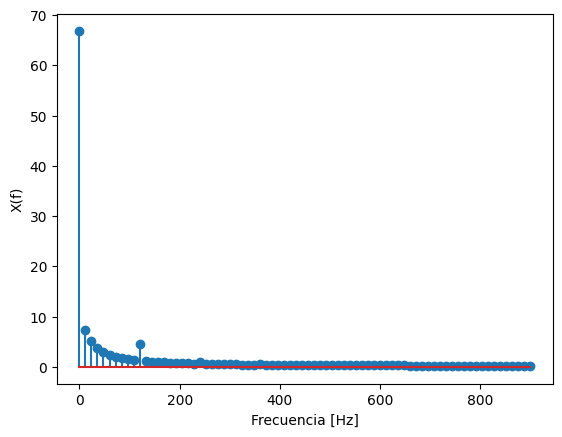

In [ ]:
vfre = np.fft.rfftfreq(len(out),1/Fs) #vector de frecuencia en Hz segun tamaño del vector y tiempo de muestreo
Xf = np.fft.rfft(out)

plt.stem(vfre,abs(Xf/len(out)))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('X(f)')
plt.show()

# **PUNTO 4**



Este código permite instalar y utilizar las librerías necesarias para descargar audios desde YouTube en formato MP3.

1. Instalación de dependencias:
  - `yt-dlp`: Biblioteca para descargar videos y audios de YouTube y otras plataformas.
  - `soundfile`: Permite manipular archivos de audio en diferentes formatos.

2. Importación de módulos:
  - Se importa `os` para manipulación de archivos.
  - Se importa `yt_dlp` (renombrado como `youtube_dl`) para la descarga de videos.

3. Función `download_ytvid_as_mp3(video_url, name)`
Esta función descarga el audio de un video de YouTube y lo guarda en formato MP3.
  - Recibe como parámetros:
    - `video_url`: URL del video de YouTube.
    - `name`: Nombre del archivo de salida.
  - Se extrae la información del video sin descargarlo.
  - Se define `filename`, el nombre del archivo resultante con extensión `.mp3`.
  - Se configuran opciones para la descarga:
    - `'format': 'bestaudio/best'`: Se obtiene la mejor calidad de audio disponible.
    - `'keepvideo': False`: Se evita conservar el archivo de video.
    - `'outtmpl': filename`: Se establece el nombre del archivo de salida.
  - Se usa `yt-dlp` para descargar el audio y guardarlo en el archivo especificado.
  - Al finalizar, se muestra un mensaje indicando que la descarga fue completada.

Este script es útil para obtener archivos de audio de YouTube sin necesidad de software adicional.

In [ ]:
#instalar librerias necesarias para descargar audios youtube
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
!pip install soundfile

import os
import yt_dlp as youtube_dl

#funcion para descargar mp3 desde youtube
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 30.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.2.19-py3-none-any.whl size=2932965 sha256=41f48a34a37f031eac8cc8f16883bc13e1e7ba8a904a366267fd180fd2940dec
  Stored in directory: /tmp/pip-ephem-wheel-cache-ndt0ski3/wheels/2d/79/97/7209650ef73114e0fe0603480da012ad3afacb9cae6b8acd9a
Successfully built yt-dlp


Este código permite descargar un archivo desde Google Drive utilizando su `FILEID`.

1. Definición del `FILEID`:
Se establece la variable `FILEID` con el identificador único del archivo almacenado en Google Drive.

2. Uso de `wget` para la descarga
  - Se usa `wget` para descargar el archivo de Drive, superando restricciones de confirmación de descarga:
    - Primero, se obtiene el token de confirmación necesario para archivos grandes.
    - Luego, se usa este token para realizar la descarga del archivo `audios.xlsx`.
    - Se eliminan las cookies temporales (`rm -rf /tmp/cookies.txt`) después de la descarga.

3. Comandos adicionales (comentados)
  - Se incluye un comando `unzip -o codigos.zip`, comentado, que serviría para descomprimir un archivo si fuese necesario.
  - Se ejecuta `dir` para listar los archivos en el directorio actual y verificar que la descarga fue exitosa.

Este script es útil para descargar archivos desde Google Drive sin necesidad de autenticación manual.

In [ ]:
#cargar datos desde drive acceso libre
FILEID = "18S3b3P2ApgTJMCdP6KBS5P0mQpJ5A4iz"


!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O  audios.xlsx && rm -rf /tmp/cookies.txt
#!unzip -o codigos.zip
!dir

--2025-02-20 17:16:38--  https://docs.google.com/uc?export=download&confirm=&id=18S3b3P2ApgTJMCdP6KBS5P0mQpJ5A4iz
Resolving docs.google.com (docs.google.com)... 74.125.135.102, 74.125.135.138, 74.125.135.101, ...
Connecting to docs.google.com (docs.google.com)|74.125.135.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=18S3b3P2ApgTJMCdP6KBS5P0mQpJ5A4iz&export=download [following]
--2025-02-20 17:16:38--  https://drive.usercontent.google.com/download?id=18S3b3P2ApgTJMCdP6KBS5P0mQpJ5A4iz&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.135.132, 2607:f8b0:400e:c01::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.135.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15290 (15K) [application/octet-stream]
Saving to: ‘audios.xlsx’

audios.xlsx         100%[===================>]  14.93K  --.-KB/s  

Este fragmento de código lee un archivo Excel y muestra las primeras filas del contenido cargado.

1. Importación de librerías:
Se importan las siguientes librerías:
  - `pandas`: Para manejar estructuras de datos como DataFrames y leer archivos Excel.
  - `numpy`: Para realizar cálculos numéricos (aunque no se utiliza directamente en este fragmento).
  - `matplotlib.pyplot`: Para generar gráficos (aunque no se utiliza directamente en este fragmento).

2. Definición de la ruta del archivo:
Se define el nombre del archivo `file_` como `'audios.xlsx'`, que debe estar disponible en el directorio de trabajo.

3. Lectura del archivo Excel:
La función `pd.read_excel(file_)` se utiliza para leer el archivo Excel y almacenarlo en un DataFrame llamado `X`.

4. Imprimir las primeras filas:
Se imprime el contenido del DataFrame `X`, mostrando las primeras filas del archivo Excel cargado, que puede incluir columnas como `link`, `band`, `type` u otras, dependiendo de la estructura del archivo.

Este código es útil para explorar los datos de un archivo Excel antes de realizar análisis adicionales.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

file_ = 'audios.xlsx'#leer archivo xlsx con link, band, type
X  = pd.read_excel(file_)
X#imprimir filas iniciales

,link,band,type,type_num
0,https://youtu.be/77csUK9yKRk,Juan M,Correcta,1
1,https://youtu.be/3rrZOrAYWs0,Juan M,Correcta,1
2,https://youtu.be/77Hupis8K5E,Juan M,Correcta,1
3,https://youtu.be/t0ZKjT3bFGA,Juan M,Correcta,1
4,https://youtu.be/IXODRKDWdc4,Juan M,Correcta,1
...,...,...,...,...
120,https://youtu.be/Df8VhfJK-0k,Leandro,Incorrecta,2
121,https://youtu.be/1ktSqDaJH5Y,Leandro,Incorrecta,2
122,https://youtu.be/Me2NDGlUeZg,Leandro,Incorrecta,2
123,https://youtu.be/sRL4uOnCrOs,Leandro,Incorrecta,2


Este fragmento de código descarga videos desde YouTube, los convierte a formato MP3 y luego a formato WAV, organizando los archivos en una carpeta llamada "results".

1. Crear la carpeta de resultados:
  - El código intenta crear una carpeta llamada `results` para almacenar los archivos de salida.
  - Si la carpeta ya existe, se muestra un mensaje indicándolo.

2. Recorrer los videos desde el archivo Excel
  - El código obtiene las dimensiones del DataFrame `X` (el número de filas `N` y columnas `P`).
  - Luego, por cada fila (video) en el DataFrame, obtiene los siguientes detalles:
    - `link`: Enlace al video en YouTube.
    - `band`: Nombre de la banda.
    - `type`: Tipo de música (género).

3. Descargar y convertir cada video:
  - El nombre del archivo de salida se genera combinando la banda, el índice del video y el tipo de música.
  - Se llama a la función `download_ytvid_as_mp3` para descargar el video desde YouTube en formato MP3.
  - Luego, utilizando `ffmpeg`, el archivo MP3 se convierte a formato WAV.

Este código automatiza el proceso de descarga, conversión y organización de archivos de audio a partir de videos de YouTube.

In [ ]:
import subprocess
import os

#crear carpeta con resultados
try:
  os.mkdir('results')
except:
  print("Carpeta results ya existe")

#recorrer excel con videos
N, P = X.shape
Ns = N * 5 #cantidad de segmentos por cancion

for n in range(N):
    print(f"video {n+1} de {N}")
    print(f"link: {X.loc[n,'link']}\n")
    print(f"band: {X.loc[n,'band']}\n")
    print(f"type: {X.loc[n,'type']}\n")
    #ruta video n-th
    name_ = 'results/'+X.loc[n,'band']+"_"+str(n)+"_"+str(X.loc[n,'type_num']) # #video+nombre+tipo de genero musical
    #descargar mp3 desde youtube
    download_ytvid_as_mp3(X.loc[n,'link'],name_)
    #convertir a .wav
    subprocess.call(['ffmpeg','-y', '-i', name_+'.mp3',
                   name_+'.wav'])

video 1 de 125
link: https://youtu.be/77csUK9yKRk

band: Juan M

type: Correcta

[youtube] Extracting URL: https://youtu.be/77csUK9yKRk
[youtube] 77csUK9yKRk: Downloading webpage
[youtube] 77csUK9yKRk: Downloading tv client config
[youtube] 77csUK9yKRk: Downloading player d50f54ef
[youtube] 77csUK9yKRk: Downloading tv player API JSON
[youtube] 77csUK9yKRk: Downloading ios player API JSON
[youtube] 77csUK9yKRk: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=77csUK9yKRk
[youtube] 77csUK9yKRk: Downloading webpage
[youtube] 77csUK9yKRk: Downloading tv client config
[youtube] 77csUK9yKRk: Downloading player d50f54ef
[youtube] 77csUK9yKRk: Downloading tv player API JSON
[youtube] 77csUK9yKRk: Downloading ios player API JSON
[youtube] 77csUK9yKRk: Downloading m3u8 information
[info] 77csUK9yKRk: Downloading 1 format(s): 251
[download] Destination: results/Juan M_0_1.mp3
[download] 100% of   39.78KiB in 00:00:00 at 284.38KiB/s 
Download complete... resul

Este fragmento de código busca y lista todos los archivos `.wav` en una carpeta específica llamada `results`.

1. Definir la ruta de los archivos:
  - La variable `path` define la ruta donde se encuentran los archivos `.wav`, que en este caso es `'results/'`.

2. Listar los archivos `.wav`:
  - `os.listdir(path)` devuelve una lista de todos los archivos en el directorio especificado.
  - Luego, con una lista por comprensión, se filtran solo los archivos que terminan con la extensión `.wav`, creando una lista llamada `wav_files` que contiene los nombres de estos archivos.

3. Mostrar los archivos:
  - Al ejecutar `wav_files`, se muestra la lista de los archivos `.wav` encontrados en la carpeta `results`.

Este código es útil para localizar y gestionar archivos de audio en formato `.wav` en un directorio específico.

In [ ]:
#cargar .wavs y partir audios
#lista archivos .wav
path = 'results/'
wav_files = [f for f in os.listdir(path) if f.endswith('.wav')]
wav_files

['Cristian_93_1.wav',
 'Cristian_31_1.wav',
 'Leandro_116_2.wav',
 'Leandro_45_1.wav',
 'Leandro_48_1.wav',
 'Cristian_89_1.wav',
 'Juan M_22_1.wav',
 'Cristian_99_2.wav',
 'Juan M_19_1.wav',
 'Juan M_13_1.wav',
 'Cristian_97_2.wav',
 'Cristian_85_1.wav',
 'Cristian_40_2.wav',
 'Juan M_79_2.wav',
 'Leandro_56_1.wav',
 'Cristian_28_1.wav',
 'Leandro_108_2.wav',
 'Cristian_36_2.wav',
 'Cristian_95_2.wav',
 'Leandro_49_1.wav',
 'Cristian_29_1.wav',
 'Leandro_57_1.wav',
 'Leandro_115_2.wav',
 'Cristian_98_2.wav',
 'Leandro_114_2.wav',
 'Leandro_51_1.wav',
 'Juan M_66_2.wav',
 'Cristian_41_2.wav',
 'Juan M_68_2.wav',
 'Cristian_103_2.wav',
 'Juan M_3_1.wav',
 'Cristian_35_2.wav',
 'Leandro_59_1.wav',
 'Juan M_16_1.wav',
 'Cristian_26_1.wav',
 'Juan M_74_2.wav',
 'Juan M_17_1.wav',
 'Juan M_8_1.wav',
 'Leandro_117_2.wav',
 'Leandro_119_2.wav',
 'Leandro_105_2.wav',
 'Leandro_121_2.wav',
 'Leandro_50_1.wav',
 'Juan M_80_2.wav',
 'Juan M_15_1.wav',
 'Cristian_86_1.wav',
 'Juan M_12_1.wav',
 'L

Este fragmento de código instala la librería `soundfile`, que es utilizada para leer y escribir archivos de audio en diferentes formatos, como WAV.

1. Instalación de `soundfile`:
  - Se utiliza el comando `!pip install soundfile` para instalar la librería desde el repositorio de PyPI (Python Package Index).
  - `soundfile` es una librería popular para el manejo de archivos de audio en Python, especialmente para trabajar con archivos WAV y otros formatos de audio.

Este comando es necesario para poder trabajar con archivos de audio, especialmente cuando se necesita leer y escribir archivos en formato WAV.

In [ ]:
!pip install soundfile #instalar sondfile

Este fragmento de código lee archivos de audio `.wav` almacenados en la carpeta `results/`, realiza algunas comprobaciones y transformaciones, y luego almacena los segmentos procesados en un array para su análisis posterior.

1. Definir parámetros:
  - `fs`: La frecuencia de muestreo esperada (48 kHz en este caso).
  - `ts`: La duración del segmento en segundos (3 segundos).
  - `tl`: Un array con un solo valor de tiempo de inicio (0 segundos).
  - `Ns`: La cantidad de segmentos, calculada multiplicando el número de archivos `.wav` por la cantidad de puntos de inicio.
  - `x_t`: Un array vacío para almacenar los segmentos de audio (tamaño de la forma: `Ns x (ts * fs) x 2`, es decir, `Ns` segmentos con `ts * fs` muestras y 2 canales).
  - `label`: Un array vacío para almacenar las etiquetas de los géneros musicales.

2. Leer y procesar cada archivo `.wav`:
  - Se recorre cada archivo `.wav` en `wav_files`.
  - El archivo se lee usando `soundfile.read()`, que devuelve el audio y su frecuencia de muestreo.
  - Se comprueba si la frecuencia de muestreo del archivo es la esperada. Si no es así, se muestra una advertencia y se omite el archivo.
  - Se comprueba si la duración del archivo es menor a 3 segundos. Si es así, se rellena con ceros hasta alcanzar la duración deseada de 3 segundos.
  - Se extrae el segmento de 3 segundos (desde el inicio).
  - Si el archivo tiene menos de 2 canales (es decir, no es estéreo), se omite el archivo.
  - Finalmente, el segmento extraído se almacena en `x_t` y la etiqueta del género musical se almacena en `label`.

3. Resultados:
  - Al finalizar, se imprime la forma final de `x_t` (el array de segmentos de audio procesados) y la cantidad de segmentos procesados.

Este código es útil para preparar los archivos de audio para su análisis, asegurando que todos los archivos tengan las características esperadas, como frecuencia de muestreo y duración, y luego almacenándolos en un formato adecuado para análisis posteriores.

In [ ]:
import numpy as np
import soundfile as sf  # Para instalar: pip install soundfile

# Parámetros
fs = 48000  # Frecuencia de muestreo esperada
ts = 3  # Duración del segmento en segundos
tl = np.array([0])  # Solo un punto de inicio (0 segundos), ya que los audios son cortos
Ns = len(wav_files) * len(tl)  # Cantidad de segmentos (uno por audio)
x_t = np.zeros((Ns, int(ts * fs), 2))  # Ns segmentos, cantidad de muestras, 2 canales (stereo)
label = np.zeros((Ns, 1))  # Vector tipo de género
name_c = []

# Leer archivos wav
i = 0
for name in wav_files:
    # Leer archivo de audio
    x, file_fs = sf.read(path + name)

    # Verificar si la frecuencia de muestreo es diferente de la esperada
    if file_fs != fs:
        print(f"Advertencia: {name} tiene una frecuencia de muestreo {file_fs}, esperada {fs}.")
        continue  # Saltar este archivo

    # Verificar si el archivo tiene menos de 3 segundos
    audio_duration = x.shape[0] / file_fs  # Duración en segundos
    if audio_duration < ts:
        # Rellenar con ceros para que tenga exactamente 3 segundos
        padding = np.zeros((int(ts * fs) - x.shape[0], x.shape[1]))
        x = np.vstack((x, padding))
        print(f"Audio {name} rellenado con ceros (duración original: {audio_duration}s).")

    # Extraer segmento desde el inicio (0 segundos)
    start_idx = 0
    end_idx = int(ts * fs)
    segment = x[start_idx:end_idx, :]

    # Verificar si el archivo tiene 2 canales
    if segment.shape[1] != 2:
        print(f"Advertencia: {name} no tiene 2 canales. Se ignorará.")
        continue

    # Asignar segmento al conjunto final
    x_t[i] = segment
    label[i] = int(name[-5])  # Tipo de género (asumido como el quinto carácter desde el final del nombre)
    name_c += [name[:-6]]
    print(f"{i} lectura: {name}; segmento extraído; tipo música {label[i]}")
    i += 1

# Imprimir resultado final
print(f"Forma final de x_t: {x_t[:i].shape}")
print(f"Cantidad de segmentos procesados: {i}")


0 lectura: Cristian_93_1.wav; segmento extraído; tipo música [1.]
1 lectura: Cristian_31_1.wav; segmento extraído; tipo música [1.]
Audio Leandro_116_2.wav rellenado con ceros (duración original: 2.5542083333333334s).
2 lectura: Leandro_116_2.wav; segmento extraído; tipo música [2.]
Audio Leandro_45_1.wav rellenado con ceros (duración original: 1.9272708333333333s).
3 lectura: Leandro_45_1.wav; segmento extraído; tipo música [1.]
Audio Leandro_48_1.wav rellenado con ceros (duración original: 2.3684375s).
4 lectura: Leandro_48_1.wav; segmento extraído; tipo música [1.]
5 lectura: Cristian_89_1.wav; segmento extraído; tipo música [1.]
Audio Juan M_22_1.wav rellenado con ceros (duración original: 2.6026666666666665s).
6 lectura: Juan M_22_1.wav; segmento extraído; tipo música [1.]
7 lectura: Cristian_99_2.wav; segmento extraído; tipo música [2.]
8 lectura: Juan M_19_1.wav; segmento extraído; tipo música [1.]
Audio Juan M_13_1.wav rellenado con ceros (duración original: 2.624s).
9 lectura:

Este código utiliza la función `Audio` de la librería `IPython.display` para reproducir un segmento de audio extraído previamente. El segmento de audio se selecciona desde el array `x_t`, que contiene los segmentos procesados. En este caso, se accede al 56º segmento de audio utilizando el índice `55`, ya que los índices comienzan desde cero. Luego, se aplica la transposición del segmento con `.T` para asegurarse de que los datos estén en el formato correcto, es decir, con la estructura `(muestras, canales)` que espera la función `Audio`. El array `x_t` tiene la forma `(segmentos, muestras, canales)`, por lo que la transposición convierte el array de tres dimensiones en dos dimensiones.

A continuación, se pasa la frecuencia de muestreo `fs` (48 kHz) como parámetro a la función `Audio` a través del argumento `rate`. Esto garantiza que el audio se reproduzca a la velocidad correcta. Finalmente, la función `Audio(x_t[55].T, rate=fs)` reproduce el segmento de audio seleccionado con la frecuencia de muestreo especificada. Si se desea escuchar otro segmento, simplemente se cambia el índice `55` por otro valor dentro del rango de segmentos disponibles.

Este proceso permite escuchar cualquier segmento de audio extraído y procesado previamente, lo que facilita la visualización y análisis de los datos de audio.

In [ ]:
from IPython.display import Audio #reproducir segmento
Audio(x_t[55].T,rate=fs)

El código realiza una Transformada Rápida de Fourier (FFT) sobre los segmentos de audio, aplicándola a lo largo del eje temporal para cada canal y luego promediando las componentes espectrales de ambos canales.

Primero, se calcula el vector de frecuencias con la función `np.fft.rfftfreq`, que utiliza el número de muestras en cada segmento y el intervalo de muestreo para obtener las frecuencias correspondientes, desde 0 Hz hasta la frecuencia de Nyquist. Luego, se aplica la FFT a cada segmento de audio usando `np.fft.rfft`, calculando las componentes de frecuencia positivas a lo largo del tiempo para cada canal de audio. Posteriormente, los espectros de los dos canales se promedian para obtener una representación espectral combinada. Finalmente, se verifica la forma del resultado, que refleja el número de segmentos de audio procesados y la cantidad de componentes de frecuencia obtenidas a partir de la FFT.


In [ ]:
#calculo de fourier
vf = np.fft.rfftfreq(x_t.shape[1],1/fs) #calculo vector de frecuencias
Xw = np.fft.rfft(x_t,axis=1).mean(axis=-1) #transformada rapida de Fourier para señal Real a lo largo del tiempo (axis=1) y se promedian los dos canales
Xw.shape

(125, 72001)

El código grafica la señal de audio en el dominio del tiempo, promediando ambos canales del audio estéreo. Para ello, se utiliza `np.arange(0, ts, 1/fs)` para crear el vector de tiempo en función de la duración del segmento de audio `ts` y la frecuencia de muestreo `fs`. Luego, se toma el promedio a lo largo del eje de los canales (`axis=-1`) para combinar las señales de los dos canales estéreo en una sola señal. Finalmente, se grafica esta señal utilizando `plt.plot` y se añaden etiquetas para los ejes de tiempo y amplitud.



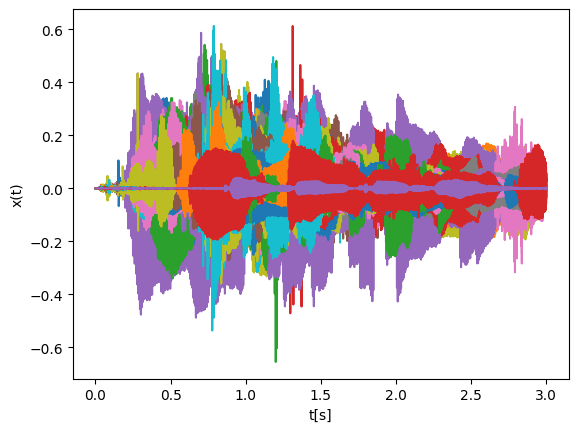

In [ ]:
#grafica tiempo y fourier
plt.plot(np.arange(0,ts,1/fs),x_t.mean(axis=-1).T) #se promedian los dos canales stereo
plt.xlabel('t[s]')
plt.ylabel('x(t)')
plt.show()

Este código grafica el espectro de la señal en el dominio de la frecuencia. Primero, se utiliza `vf` como el vector de frecuencias generado previamente por `np.fft.rfftfreq`, que contiene las frecuencias correspondientes a cada valor de la transformada rápida de Fourier. Luego, se calcula la magnitud de la transformada `Xw` usando `abs(Xw)` para obtener los valores absolutos de los coeficientes de Fourier. Finalmente, se grafican las frecuencias en el eje x y la magnitud de la transformada en el eje y, lo que permite visualizar cómo se distribuye la energía de la señal en función de las frecuencias.


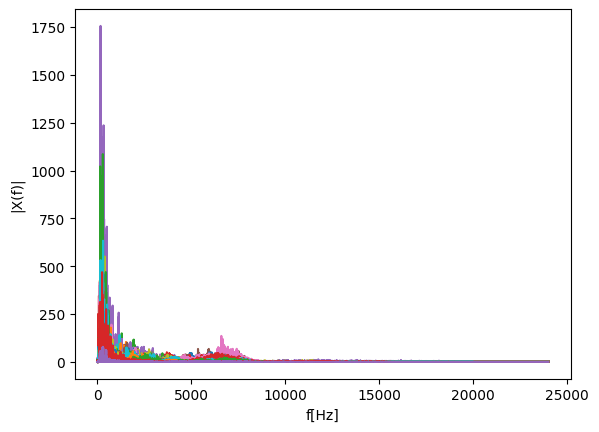

In [ ]:
plt.plot(vf,abs(Xw).T)
plt.xlabel('f[Hz]')
plt.ylabel('|X(f)|')
plt.show()

En este segmento de código, primero se normaliza el espectro de la señal para evitar inconsistencias debidas a diferencias en las amplitudes máximas de los diferentes espectros de las señales. Se utiliza `MinMaxScaler` de la librería `sklearn.preprocessing` para escalar los valores de la magnitud de la transformada de Fourier (`abs(Xw)`) entre 0 y 1. Esta normalización asegura que los espectros puedan ser comparados de manera uniforme.

Después de la normalización, el primer gráfico muestra el espectro en términos de la magnitud, con el eje x representando las frecuencias (`vf`) y el eje y la magnitud del espectro (`Xw_`). Posteriormente, se realiza una conversión del espectro a decibelios (dB) utilizando la fórmula $20 \log_{10}(X(f)) $, con un pequeño valor agregado $(1e-10)$ para evitar discontinuidades en el cálculo del logaritmo. El segundo gráfico muestra este espectro en decibelios, lo cual es útil para representar señales con una gran gama de amplitudes.


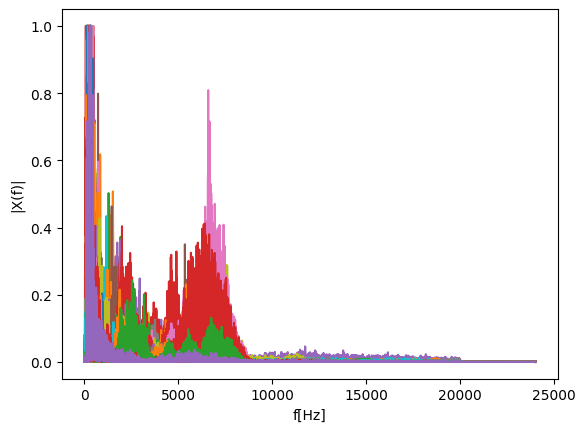

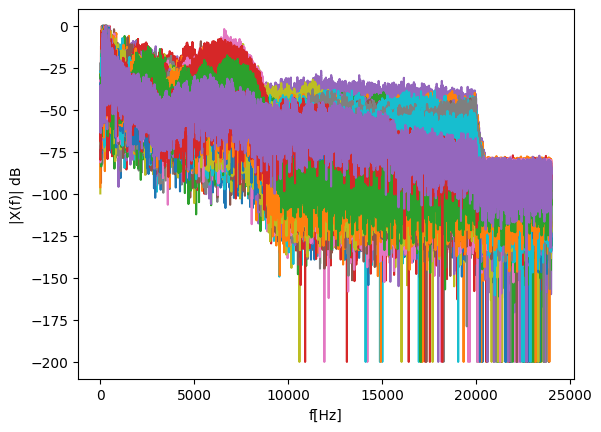

In [ ]:
#se normalizan espectros entre 0 y 1 para evitar inconsistencias por ampliltudes máximas
from sklearn.preprocessing import MinMaxScaler
sca = MinMaxScaler()
Xw_ = sca.fit_transform(abs(Xw).T).T

plt.plot(vf,Xw_.T)
plt.xlabel('f[Hz]')
plt.ylabel('|X(f)|')
plt.show()

#en dB
plt.plot(vf,(20*np.log10(Xw_+1e-10)).T) # se suma 1e-10 para evitar discontinuidad del log
plt.xlabel('f[Hz]')
plt.ylabel('|X(f)| dB')
plt.show()

En este bloque de código se emplean dos técnicas de reducción de dimensionalidad para visualizar los datos en un espacio bidimensional. En primer lugar, se utiliza **t-SNE** (t-Distributed Stochastic Neighbor Embedding), que es un método no lineal útil para visualizar datos de alta dimensión en un espacio de baja dimensión, preservando las relaciones locales entre las muestras. Se establece la **perplejidad** en 20, el número de componentes en 2 (para que los datos puedan visualizarse en un gráfico 2D), y se utiliza `init='pca'` para inicializar el t-SNE con los componentes principales obtenidos de un análisis previo con PCA, lo que puede ayudar a mejorar el rendimiento.

El espectro de las señales se limita a las primeras frecuencias hasta fmax (7000 Hz) para reducir la cantidad de datos y centrar la visualización en las frecuencias más relevantes.

Alternativamente, se podría haber utilizado **PCA** (Análisis de Componentes Principales) en lugar de t-SNE, lo cual es un método lineal para la reducción de dimensionalidad que preserva las varianzas principales de los datos. En el código original se proporciona una opción comentada para usar PCA si se prefiere este enfoque lineal.


In [ ]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
#visualización de datos
red_ = TSNE(perplexity = 20,n_components=2,random_state=123,learning_rate='auto',init='pca')
#red_ = PCA(n_components=2,random_state=123)
fmax = 7000
X_2D = red_.fit_transform(Xw_[:,:fmax]) #se tiene en cuenta el espectro hasta fmax Hz

En este bloque de código, se visualiza la separabilidad de las muestras en el espacio bidimensional reducido utilizando t-SNE o PCA. El primer gráfico es un diagrama de dispersión donde los puntos están coloreados según su etiqueta, que representa el género musical de cada archivo de audio. Se agrega una barra de color (`colorbar`) para indicar cómo las etiquetas están mapeadas a los colores.

El segundo gráfico también es un diagrama de dispersión, pero con los nombres de las canciones anotados junto a cada punto. Para hacer esto, se utiliza la función `plt.text()` para colocar un texto junto a cada punto, ajustando la posición para que no se solapen. Los colores de los puntos están definidos en función de las etiquetas, y se emplea una lista de colores (`color_`) que asigna un color a cada tipo de género musical. Este gráfico proporciona una visualización más detallada, permitiendo ver cómo cada canción se posiciona en el espacio reducido y cómo se distribuyen los diferentes géneros musicales.

Al observar ambos gráficos, se puede evaluar cuán separables son las canciones en el espacio reducido y cómo las etiquetas corresponden a las diferentes distribuciones de los datos.


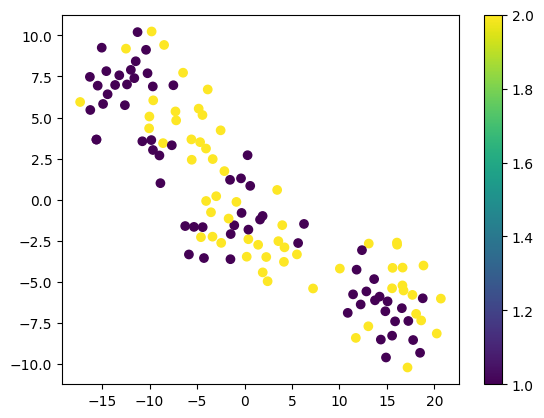

<ipython-input-21-6e94555dcd77>:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.text(X_2D[i,0]*1.025,X_2D[i,1]*1.025, tex[:-2]+"_"+str(i), fontsize=6,color=color_[int(label[i]-1)])


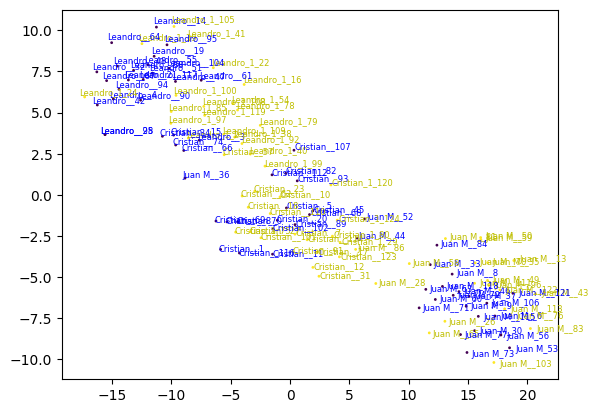

In [ ]:
#graficar separabilidad 2D
plt.scatter(X_2D[:,0],X_2D[:,1],c=label)
plt.colorbar()
plt.show()

color_ = ["b","y"]
#nombre cancion
plt.scatter(X_2D[:,0],X_2D[:,1],c=label,s=1)
for i, tex in enumerate(name_c):
    #print(f"{i} {tex}")
    plt.text(X_2D[i,0]*1.025,X_2D[i,1]*1.025, tex[:-2]+"_"+str(i), fontsize=6,color=color_[int(label[i]-1)])

#plt.colorbar()
plt.show()

El código proporcionado está diseñado para reproducir un archivo de audio específico de la lista `x_t` en la posición $ i = 55 $ utilizando la librería `IPython.display.Audio` y la frecuencia de muestreo `fs` definida previamente. La señal de audio se selecciona de la matriz `x_t`, que contiene los segmentos de audio, y la transposición `.T` es usada para asegurar que el formato de la señal sea compatible con la reproducción.



In [ ]:
#reproducir audio
i=55
Audio(x_t[i].T,rate=fs)

El código proporcionado está diseñado para reproducir un archivo de audio específico de la lista `x_t` en la posición $ i = 23 $ utilizando la librería `IPython.display.Audio` y la frecuencia de muestreo `fs` definida previamente. La señal de audio se selecciona de la matriz `x_t`, que contiene los segmentos de audio, y la transposición `.T` es usada para asegurar que el formato de la señal sea compatible con la reproducción.

In [ ]:
i = 23
Audio(x_t[i].T,rate=fs)

El código proporcionado está diseñado para reproducir un archivo de audio específico de la lista `x_t` en la posición $ i = 64 $ utilizando la librería `IPython.display.Audio` y la frecuencia de muestreo `fs` definida previamente. La señal de audio se selecciona de la matriz `x_t`, que contiene los segmentos de audio, y la transposición `.T` es usada para asegurar que el formato de la señal sea compatible con la reproducción.

In [ ]:
i = 64
Audio(x_t[i].T,rate=fs)

El código proporciona una forma de guardar un modelo en un archivo utilizando la librería `joblib`. Si el directorio 'modelo' no existe, se crea con `os.mkdir()`. Luego, el modelo que contiene los datos de la variable `Xw_`, la frecuencia máxima `fmax`, las etiquetas `label`, los nombres de las canciones `name_c`, el vector de frecuencias `vf` y la frecuencia de muestreo `fs` es guardado en un archivo con el nombre `palabras_clave.pkl` dentro del directorio 'modelo'.

Este proceso asegura que los datos y el modelo estén disponibles para ser cargados y utilizados en el futuro.


In [ ]:
import joblib
#guardar modelo
if not os.path.exists('modelo'):
    os.mkdir('modelo')
filename_ = 'modelo/palabras_clave'
model_ ={'Xw_':Xw_,'fmax': fmax, 'label' : label, 'name_c' : name_c, 'vf':vf,'fs':fs}
joblib.dump(model_,filename_+".pkl")


['modelo/palabras_clave.pkl']

El código permite guardar los resultados del modelo en un archivo comprimido (.zip). Primero, se utiliza `datetime.now().strftime()` para generar un nombre único basado en la fecha y la hora actual. Luego, se utiliza `shutil.make_archive()` para comprimir la carpeta 'modelo' en un archivo `.zip`. Este archivo se descarga con `files.download()`.

El archivo `.zip` puede ser cargado en Google Drive y luego utilizado en otro cuaderno para detectar el género musical de nuevos segmentos de audio. Esto facilita la reutilización del modelo sin necesidad de generar nuevos resultados en cada ejecución.

In [ ]:
#descargar modelo
#guardar resultados
from google.colab import files
from datetime import date, datetime
import shutil
#guardar resultados
namefile = str(datetime.now().strftime("%Y_%m_%d_%H_%M_%d"))+'modelo'
shutil.make_archive(namefile, 'zip', 'modelo')
files.download(namefile+'.zip')

#el archivo .zip puede cargarse en drive y utilizarse en otro cuaderno para detectar género musical de nuevos segmentos

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

El código carga un modelo previamente guardado utilizando `joblib.load()`. Después de cargar el modelo, se obtienen las claves del diccionario contenido en el modelo con `my_model_loaded.keys()`. Esto permite acceder a las variables que se guardaron al momento de crear el modelo y utilizarlas para hacer predicciones o análisis posteriores.

El proceso de carga del modelo es crucial cuando se quiere reutilizar un modelo previamente entrenado sin necesidad de volver a entrenarlo desde cero. Las claves devueltas por `keys()` permiten verificar los elementos almacenados y asegurarse de que el modelo se haya cargado correctamente.


In [ ]:
#cargar modelo
my_model_loaded = joblib.load(filename_+".pkl")
my_model_loaded.keys()

dict_keys(['Xw_', 'fmax', 'label', 'name_c', 'vf', 'fs'])

---------------------------

Este código en Python permite cargar, reproducir y visualizar un archivo de audio en Google Colab utilizando las bibliotecas librosa, matplotlib y IPython.display. Primero, solicita al usuario que suba un archivo de audio mediante files.upload() y extrae su nombre para su posterior procesamiento. Luego, carga el archivo de audio con librosa.load(), manteniendo su frecuencia de muestreo original. A continuación, reproduce el audio usando IPython.display.Audio. Posteriormente, grafica la forma de onda del audio con librosa.display.waveshow(), lo que permite visualizar su amplitud a lo largo del tiempo. Finalmente, imprime la forma (shape) del array de datos de audio y la frecuencia de muestreo, proporcionando información relevante sobre el archivo cargado.

Saving Correcto 7.mp3 to Correcto 7.mp3
Reproduciendo: Correcto 7.mp3


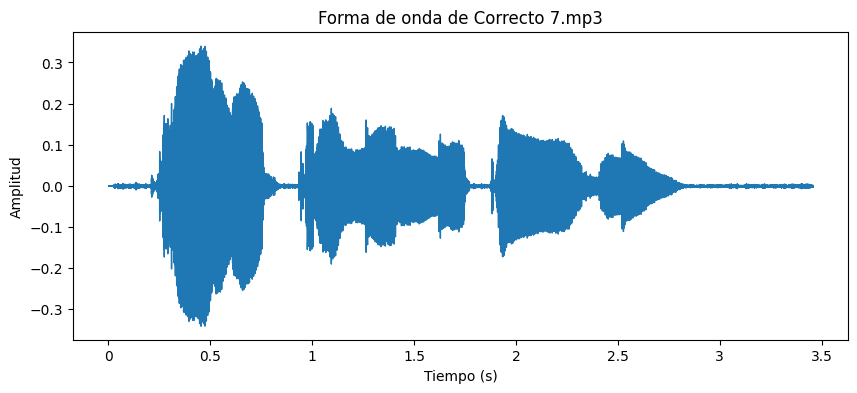

Shape del audio: (165888,)
Frecuencia de muestreo: 48000 Hz


In [ ]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import Audio

# 1. Subir el archivo de audio
uploaded = files.upload()

# 2. Obtener el nombre del archivo subido
nuevo_audio = list(uploaded.keys())[0]  # Obtener el nombre del primer archivo subido

# 3. Cargar el audio
y, sr = librosa.load(nuevo_audio, sr=None)  # Cargar con la frecuencia de muestreo original

# 4. Reproducir el audio
print(f"Reproduciendo: {nuevo_audio}")
display(Audio(nuevo_audio, rate=sr))

# 5. Mostrar la forma de onda
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(f"Forma de onda de {nuevo_audio}")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# 6. Mostrar el array de audio (shape)
print(f"Shape del audio: {y.shape}")
print(f"Frecuencia de muestreo: {sr} Hz")

Este código ajusta la duración del audio a 3 segundos y lo visualiza en un gráfico. Primero, define la duración deseada en segundos y la convierte en el número correspondiente de muestras según la frecuencia de muestreo (sr). Luego, si el audio es más largo que la cantidad de muestras deseadas, lo recorta; si es más corto, lo rellena con ceros para igualarlo a la duración especificada. Posteriormente, se grafica la nueva forma de onda utilizando librosa.display.waveshow(), mostrando cómo se ve el audio después del ajuste. Finalmente, se imprime la nueva forma (shape) del array de audio, indicando su longitud tras la modificación.

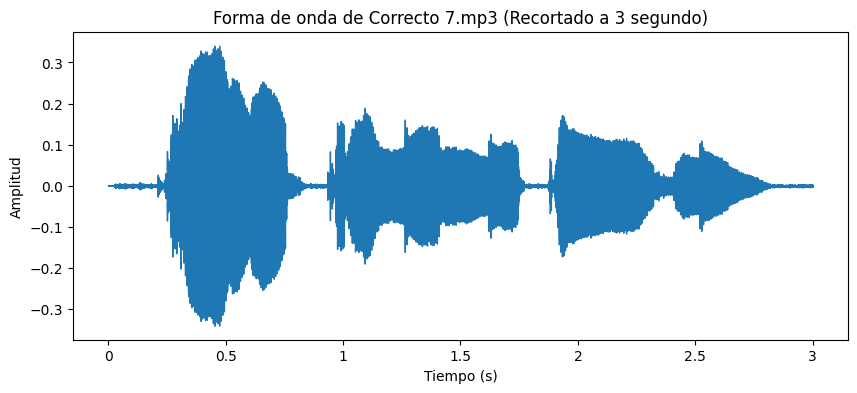

Shape del audio recortado: (144000,)


In [ ]:
# 1. Definir la duración deseada en segundos
duracion_deseada = 3.0  # 3 segundos

# 2. Convertir la duración deseada en muestras
muestras_deseadas = int(duracion_deseada * sr)

# 3. Recortar o rellenar con ceros si es necesario
if len(y) > muestras_deseadas:
    y = y[:muestras_deseadas]  # Recortar
elif len(y) < muestras_deseadas:
    y = np.pad(y, (0, muestras_deseadas - len(y)))  # Rellenar con ceros

# 4. Graficar el audio recortado
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sr)
plt.title(f"Forma de onda de {nuevo_audio} (Recortado a 3 segundo)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.show()

# Mostrar la nueva longitud del audio recortado
print(f"Shape del audio recortado: {y.shape}")

Este código calcula y visualiza el espectro de frecuencia normalizado de una señal de audio recortada a 3 segundos. Primero, obtiene la Transformada Rápida de Fourier (RFFT) de la señal para analizar su contenido en frecuencia. Luego, extrae la magnitud del espectro, que representa la intensidad de cada componente de frecuencia. Para escalar los valores en un rango de 0 a 1, aplica una normalización con MinMaxScaler(). Posteriormente, genera el eje de frecuencias correspondientes y grafica el espectro normalizado con plt.plot(), permitiendo visualizar la distribución de energía en el dominio de la frecuencia. Finalmente, imprime los primeros 10 valores del espectro normalizado para una vista rápida de los resultados.

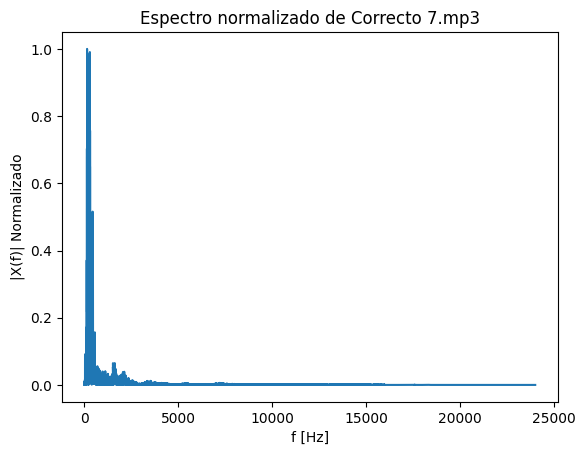

Espectro normalizado (primeros 10 valores): [0.00099476 0.0032607  0.00400346 0.00149626 0.00280477 0.000591
 0.0027797  0.00408753 0.00051655 0.00347708]


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# 1. Calcular la transformada rápida de Fourier (RFFT)
Xw_nuevo = np.fft.rfft(y)  # RFFT de la señal recortada

# 2. Obtener la magnitud del espectro
Xw_mag_nuevo = np.abs(Xw_nuevo)

# 3. Normalizar el espectro entre 0 y 1
sca = MinMaxScaler()
Xw_nuevo_normalizado = sca.fit_transform(Xw_mag_nuevo.reshape(-1, 1)).flatten()  # Normalización

# 4. Graficar el espectro normalizado
vf_nuevo = np.fft.rfftfreq(len(y), 1/sr)  # Frecuencias correspondientes a la RFFT

plt.plot(vf_nuevo, Xw_nuevo_normalizado)
plt.xlabel('f [Hz]')
plt.ylabel('|X(f)| Normalizado')
plt.title(f"Espectro normalizado de {nuevo_audio}")
plt.show()

# Mostrar el espectro normalizado
print("Espectro normalizado (primeros 10 valores):", Xw_nuevo_normalizado[:10])


El módulo cdist de scipy.spatial.distance se utiliza para calcular distancias entre pares de puntos en dos conjuntos de datos. Es útil para medir similitudes o diferencias entre vectores en espacios multidimensionales.

In [ ]:
from scipy.spatial.distance import cdist

El código my_model_loaded['Xw_'].flatten() intenta acceder al valor almacenado en la clave 'Xw_' de un diccionario u objeto similar (my_model_loaded), y luego lo aplana con .flatten().

In [ ]:
my_model_loaded['Xw_'].flatten()

array([2.00392438e-03, 1.29261380e-03, 1.27994411e-03, ...,
       1.95652510e-05, 2.66048371e-05, 1.09033504e-05])

Este código usa np.pad() para rellenar un array con ceros y luego lo redimensiona a una forma específica.

In [ ]:
Xw_nuevo_normalizado = np.pad(
    Xw_nuevo_normalizado, (0, 72001 - len(Xw_nuevo_normalizado)), mode='constant').reshape(1, 72001)

El método .flatten() convierte un array multidimensional en un array unidimensional (1D).

In [ ]:
Xw_nuevo_normalizado.flatten()

array([9.94758150e-04, 3.26070029e-03, 4.00346051e-03, ...,
       1.22850000e-06, 1.17332218e-06, 1.15684039e-06])

Muestra las dimensiones (forma) de los arrays my_model_loaded['Xw_'] y Xw_nuevo_normalizado.

In [ ]:
print(my_model_loaded['Xw_'].shape)
print(Xw_nuevo_normalizado.shape)

(125, 72001)
(1, 72001)


El código calcula la distancia euclidiana entre dos representaciones espectrales de señales de audio.

In [ ]:
similarity = cdist(my_model_loaded['Xw_'], Xw_nuevo_normalizado.reshape(1,-1), metric='euclidean')
print(similarity)

[[ 5.96150771]
 [ 7.55331863]
 [ 6.70193175]
 [11.70643371]
 [ 8.90228844]
 [ 5.84377054]
 [ 9.29702135]
 [ 5.62249338]
 [ 8.11582108]
 [ 8.88285048]
 [ 5.9836516 ]
 [ 6.20300716]
 [ 7.19713568]
 [11.0965192 ]
 [ 9.68387725]
 [ 7.06371626]
 [10.67108565]
 [ 6.6863634 ]
 [ 5.9143392 ]
 [ 8.61606526]
 [ 0.22179669]
 [ 9.26497268]
 [10.44052235]
 [ 6.34928927]
 [13.90946412]
 [ 9.36794956]
 [ 9.70587682]
 [ 6.31989109]
 [11.92052257]
 [ 6.75231005]
 [10.02916721]
 [ 6.96374217]
 [10.63097861]
 [ 7.89337721]
 [ 8.06831549]
 [11.28565598]
 [ 8.92528598]
 [ 8.65721491]
 [ 6.91163285]
 [ 9.65809238]
 [ 7.02114656]
 [12.27683021]
 [11.1996492 ]
 [16.57359633]
 [ 6.95783177]
 [ 6.86220394]
 [ 8.46346376]
 [ 8.33988637]
 [ 9.23323612]
 [10.05907535]
 [ 9.5867732 ]
 [ 7.92148475]
 [ 9.03737956]
 [11.07886209]
 [ 7.43248597]
 [ 8.93102951]
 [10.14239786]
 [ 6.73729141]
 [11.29375444]
 [10.11967638]
 [ 9.14175553]
 [ 8.433542  ]
 [ 7.03395092]
 [ 9.75412524]
 [11.71356283]
 [13.54166799]
 [ 6.76069

Determinar si el nuevo audio es suficientemente similar a una referencia en la base de datos y decidir si es válido o no.

In [ ]:
index_closer = np.argmin(similarity)  # Índice del audio más cercano

closest_label = my_model_loaded['label'][index_closer]

umbral_distancia = 0.30

# Si similarity es 1D, accede a similarity[index_closer] en lugar de similarity[0, index_closer]
if closest_label == 1 and similarity[index_closer] < umbral_distancia:
    print("✅ Audio ACEPTADO")
else:
    print("❌ Audio RECHAZADO")

✅ Audio ACEPTADO
